# Library

In [1]:
from PIL import Image
import requests
import torch
import matplotlib.pyplot as plt
import torch.nn.functional as F
import csv
import cv2
from cv2 import imshow
import os
import numpy as np
import pandas as pd
import random
import glob
from scipy.io import loadmat
from pathlib import Path
import json
# from mpl_toolkits.axisartist import ImageGrid

plt.style.use("dark_background")

In [2]:
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data, io, filters
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches

#SCALER & TRANSFORMATION
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
#ACCURACY CONTROL
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
#OPTIMIZER
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer, SGD
#MODEL LAYERS
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN,\
LSTM, GlobalAveragePooling2D, SeparableConv2D, ZeroPadding2D, Convolution2D, ZeroPadding2D,Reshape, Conv2DTranspose,\
LeakyReLU, GaussianNoise, GlobalMaxPooling2D, ReLU, Input, Concatenate
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model
from keras.datasets import mnist
import keras
from keras.models import Model

C:\Users\flori\AppData\Local\Temp\ipykernel_15048\1789801728.py:4: DeprecationWarning: Please import `convolve` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import convolve


# Demo CLIPSeg

In [3]:
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation, CLIPModel, CLIPProcessor, CLIPTextModel

processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
seg_model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")



c:\Users\flori\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


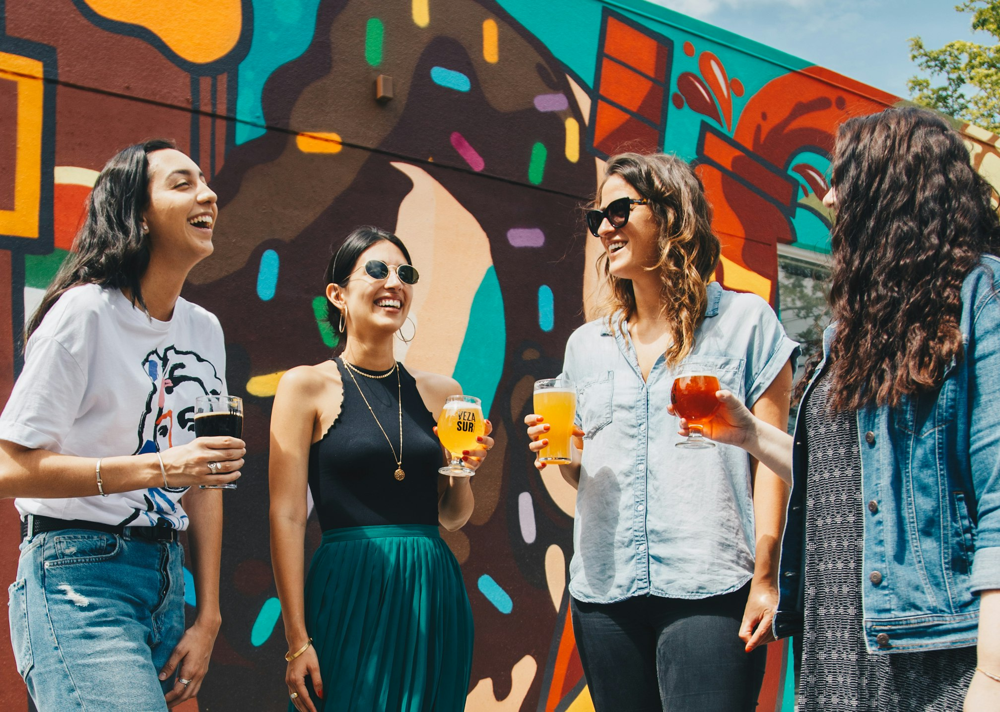

In [24]:
url = "https://images.unsplash.com/photo-1532635241-17e820acc59f?q=80&w=2015&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D"
image = Image.open(requests.get(url, stream=True).raw)
image


In [34]:
user_input = input("Input objects to segment (comma-separated): ")
prompts = user_input.split(', ')

In [35]:
inputs = processor(text=prompts, images=[image] * len(prompts), padding="max_length", return_tensors="pt")
# predict
with torch.no_grad():
  outputs = seg_model(**inputs)
preds = outputs.logits.unsqueeze(1)


Unused or unrecognized kwargs: padding.


In [21]:
print(preds.shape)

torch.Size([2, 1, 352, 352])


In [22]:
print(torch.transpose(preds, 1, 2))

tensor([[[[-6.6109, -6.6272, -6.4684,  ..., -6.3023, -6.3397, -6.4219]],

         [[-6.4668, -6.2775, -6.2408,  ..., -6.1333, -6.2068, -6.2510]],

         [[-6.1261, -5.9206, -5.9190,  ..., -5.8684, -5.9105, -5.9872]],

         ...,

         [[-2.9884, -2.9012, -2.7649,  ..., -0.5119, -0.7581, -1.0335]],

         [[-3.2067, -3.0432, -2.9484,  ..., -0.7524, -0.9815, -1.2376]],

         [[-3.3450, -3.2734, -3.1209,  ..., -0.9410, -1.2049, -1.4220]]],


        [[[-8.5748, -8.4765, -8.4707,  ..., -7.4876, -7.5116, -7.6015]],

         [[-8.4849, -8.1618, -8.2429,  ..., -7.4114, -7.4800, -7.5230]],

         [[-8.1996, -8.0164, -8.1447,  ..., -7.2287, -7.3536, -7.4261]],

         ...,

         [[-7.4645, -7.3228, -7.3075,  ..., -7.3046, -7.5233, -7.6933]],

         [[-7.5708, -7.4422, -7.4698,  ..., -7.4197, -7.6749, -7.8455]],

         [[-7.7317, -7.7584, -7.5574,  ..., -7.7237, -7.7954, -8.0599]]]])


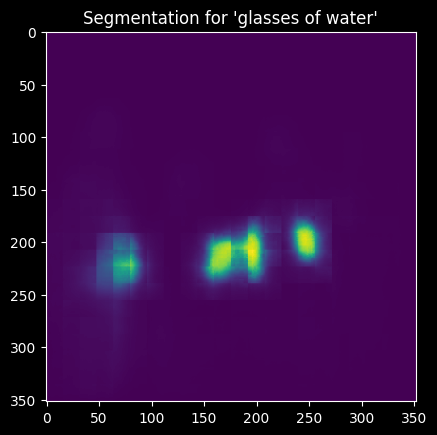

In [36]:
for i, prompt in enumerate(prompts):  
  pred = preds.squeeze(0)[i].unsqueeze(0)  
  plt.imshow(torch.sigmoid(pred.squeeze(0).squeeze(0)))  
  plt.title(f"Segmentation for '{prompt}'")  
  plt.show()


In [ ]:
def resize_mask(mask, size):
    if not size:
        return mask

    if mask.shape == ():
        return torch.zeros(size)

    mask = mask.unsqueeze(0)
    mask_resized = F.interpolate(mask, size=size, mode="nearest")
    return mask_resized.squeeze(0)

# Inference for video

In [10]:
def split_video_into_frames(video_path, output_folder):
    vidcap = cv2.VideoCapture(video_path)
    success, image = vidcap.read()
    count = 0
    if not success:
        print("Error: Failed to open the video file.")
        return

    frame_rate = vidcap.get(cv2.CAP_PROP_FPS)
    if frame_rate == 0:
        print("Error: Frame rate of the video is zero.")
        return

    milliseconds_per_frame = 1.0 / frame_rate * 1000
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    while success:
        cv2.imwrite(os.path.join(output_folder, "frame%d.jpg" % count), image)
        count += 1
        vidcap.set(cv2.CAP_PROP_POS_MSEC, milliseconds_per_frame * count)
        success, image = vidcap.read()

    vidcap.release()



video_path = 'E:/Phap.mp4'  
output_folder = 'E:/clipseg/output_frames' 
split_video_into_frames(video_path, output_folder)

In [11]:
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

Unused or unrecognized kwargs: padding.


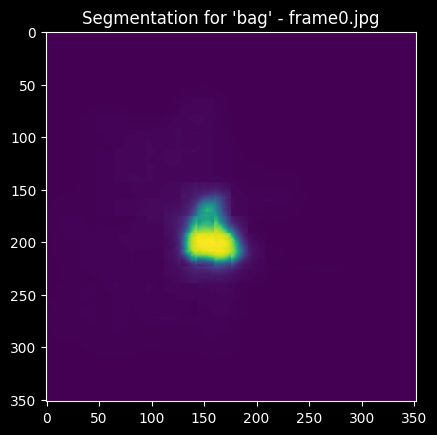

Unused or unrecognized kwargs: padding.


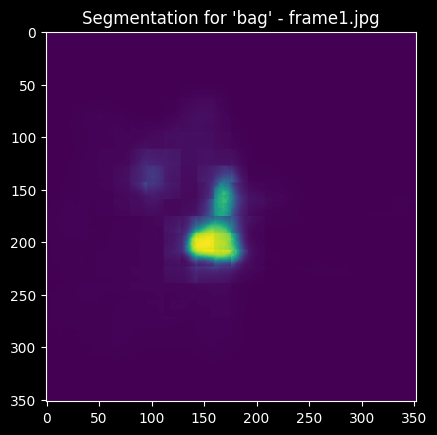

Unused or unrecognized kwargs: padding.


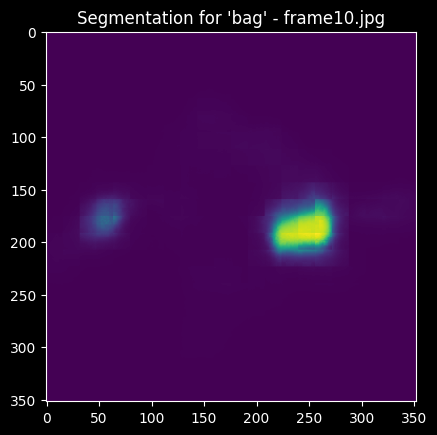

Unused or unrecognized kwargs: padding.


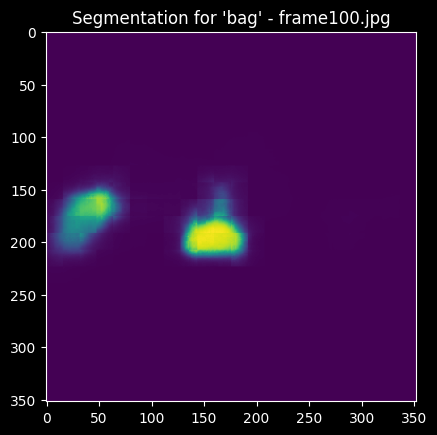

Unused or unrecognized kwargs: padding.


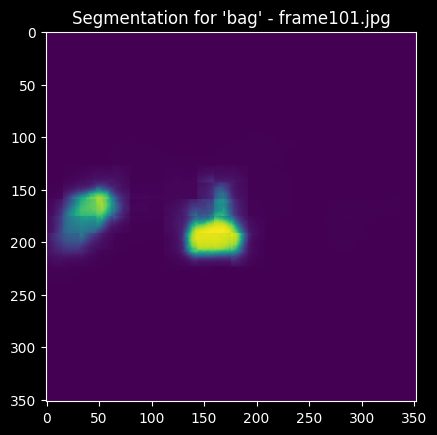

Unused or unrecognized kwargs: padding.


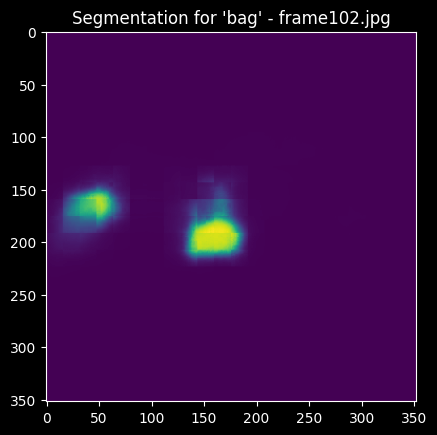

Unused or unrecognized kwargs: padding.


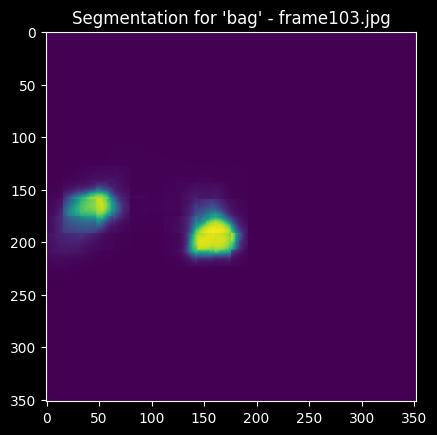

Unused or unrecognized kwargs: padding.


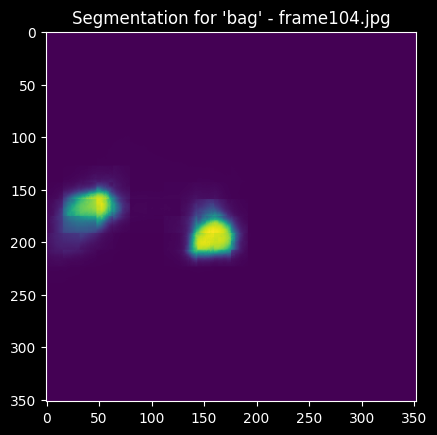

Unused or unrecognized kwargs: padding.


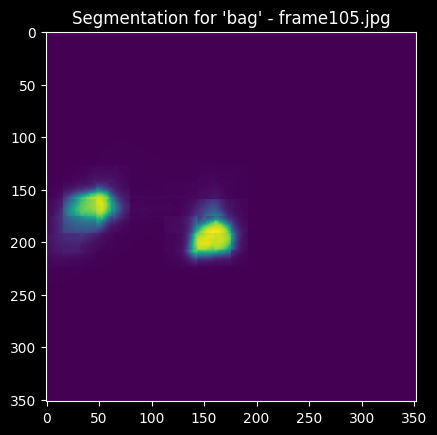

Unused or unrecognized kwargs: padding.


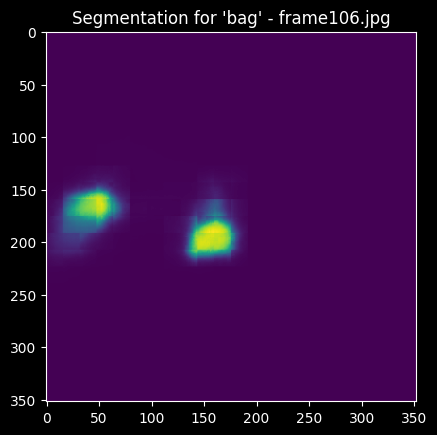

Unused or unrecognized kwargs: padding.


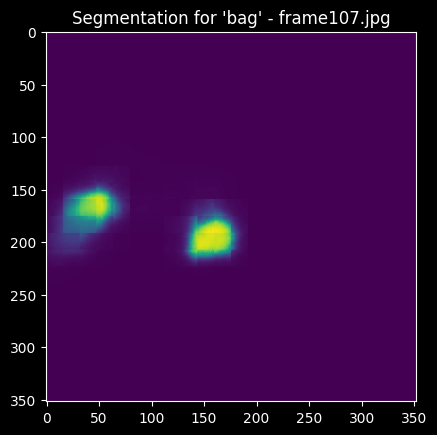

Unused or unrecognized kwargs: padding.


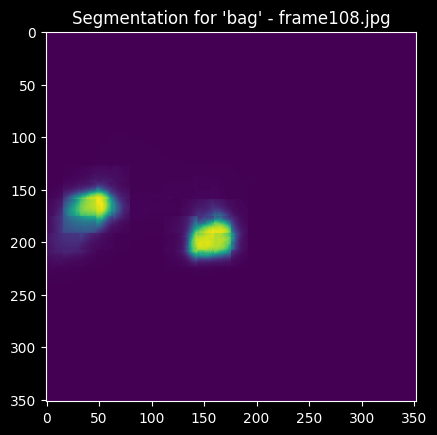

Unused or unrecognized kwargs: padding.


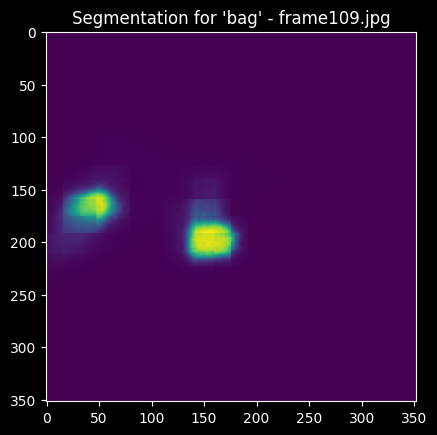

Unused or unrecognized kwargs: padding.


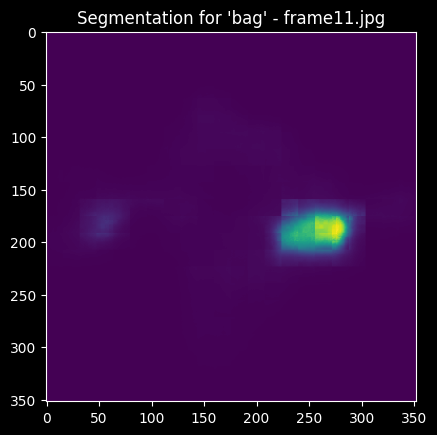

Unused or unrecognized kwargs: padding.


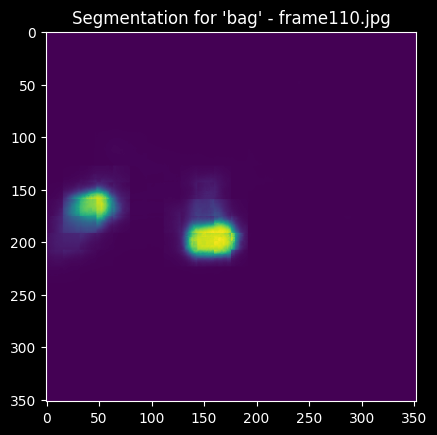

Unused or unrecognized kwargs: padding.


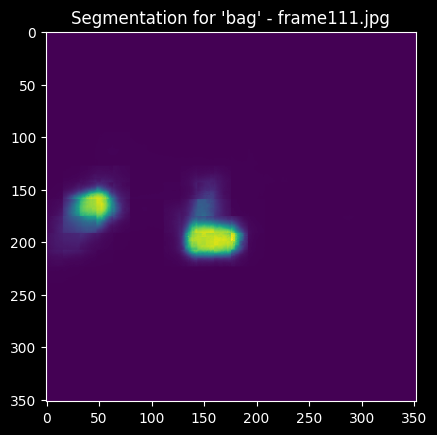

Unused or unrecognized kwargs: padding.


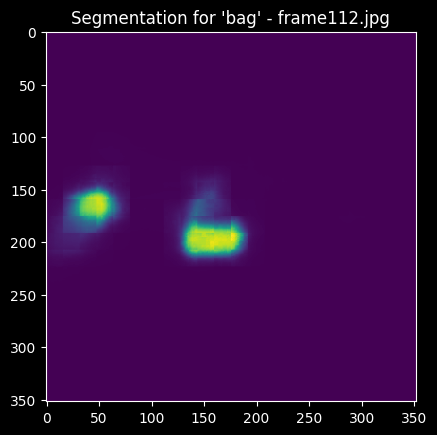

Unused or unrecognized kwargs: padding.


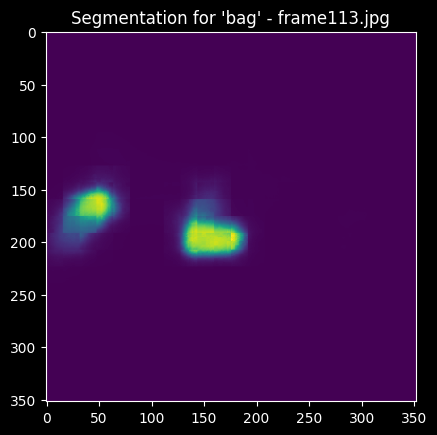

Unused or unrecognized kwargs: padding.


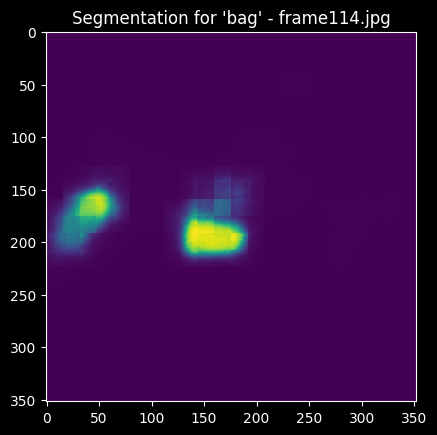

Unused or unrecognized kwargs: padding.


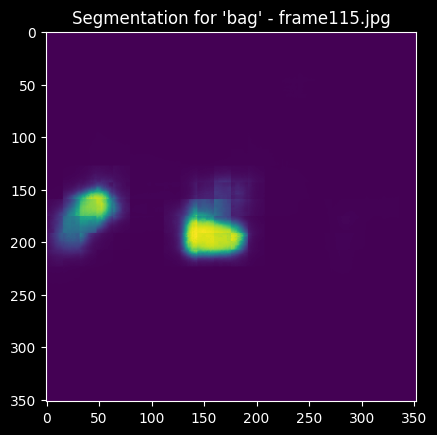

Unused or unrecognized kwargs: padding.


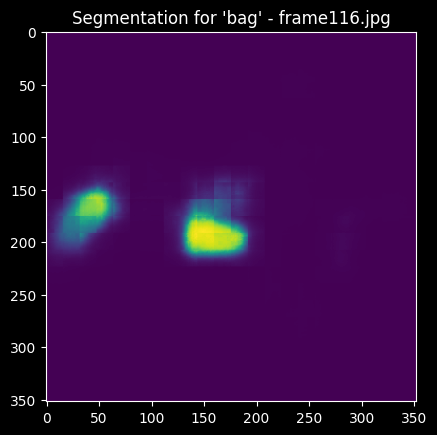

Unused or unrecognized kwargs: padding.


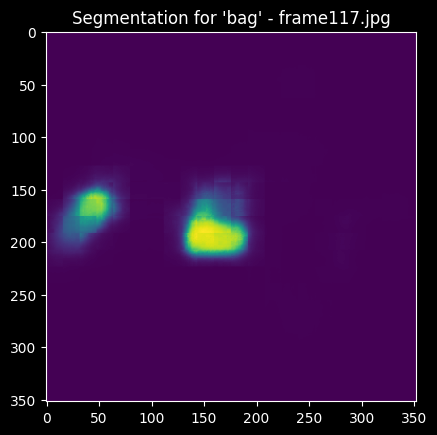

Unused or unrecognized kwargs: padding.


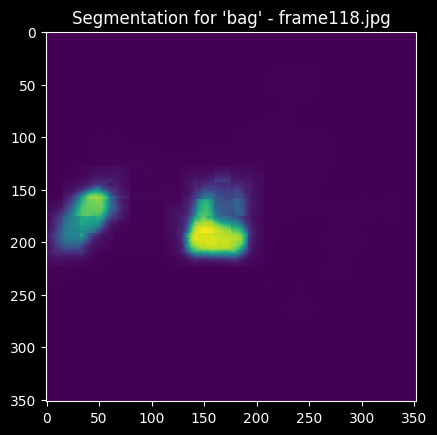

Unused or unrecognized kwargs: padding.


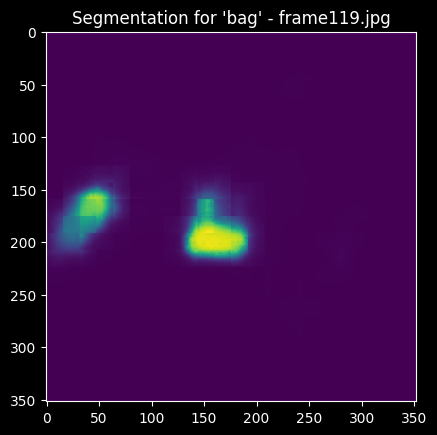

Unused or unrecognized kwargs: padding.


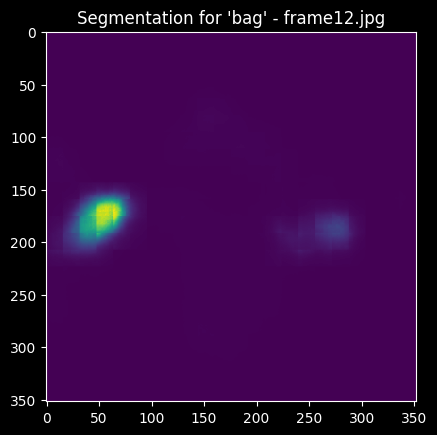

Unused or unrecognized kwargs: padding.


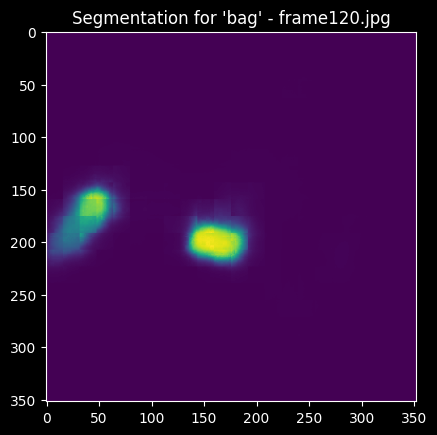

Unused or unrecognized kwargs: padding.


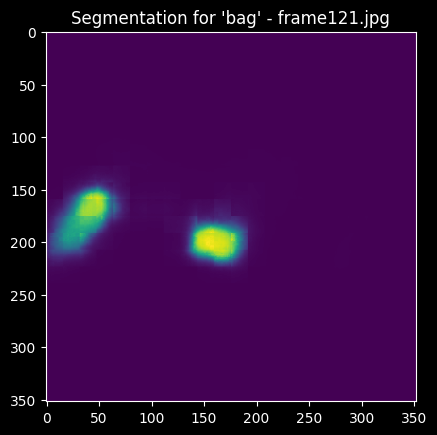

Unused or unrecognized kwargs: padding.


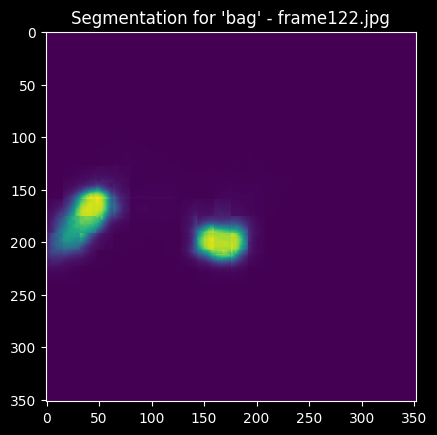

Unused or unrecognized kwargs: padding.


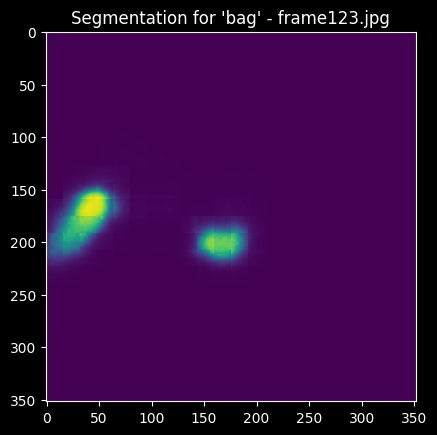

Unused or unrecognized kwargs: padding.


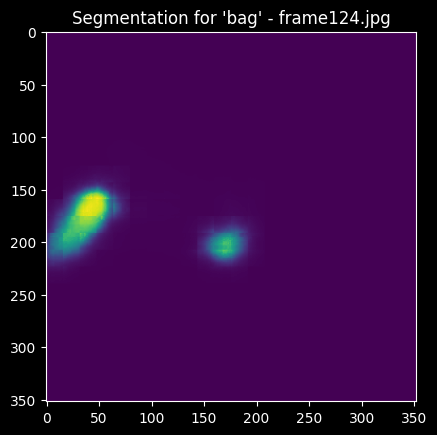

Unused or unrecognized kwargs: padding.


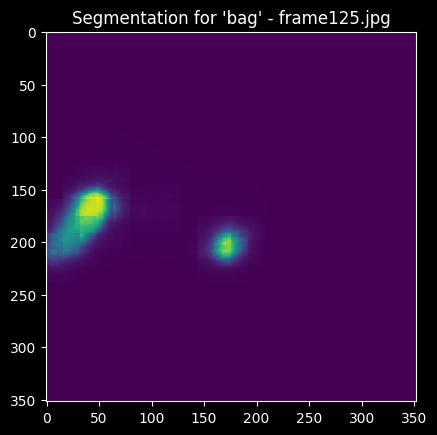

Unused or unrecognized kwargs: padding.


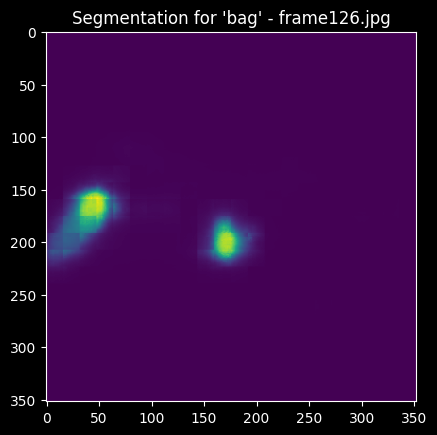

Unused or unrecognized kwargs: padding.


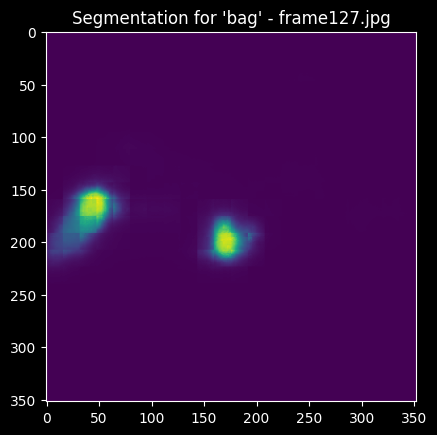

Unused or unrecognized kwargs: padding.


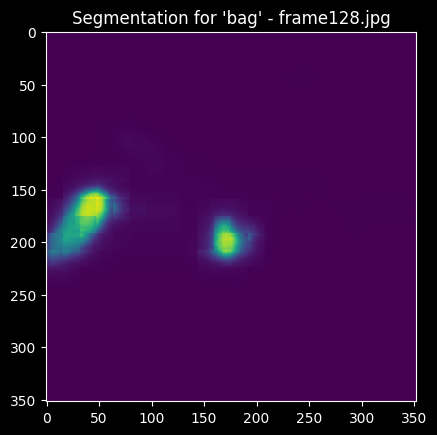

Unused or unrecognized kwargs: padding.


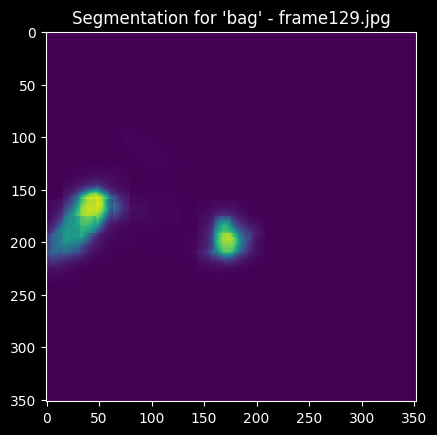

Unused or unrecognized kwargs: padding.


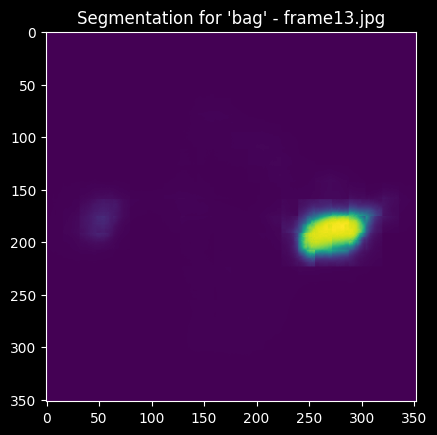

Unused or unrecognized kwargs: padding.


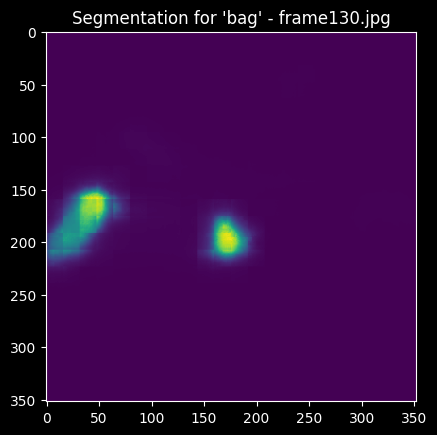

Unused or unrecognized kwargs: padding.


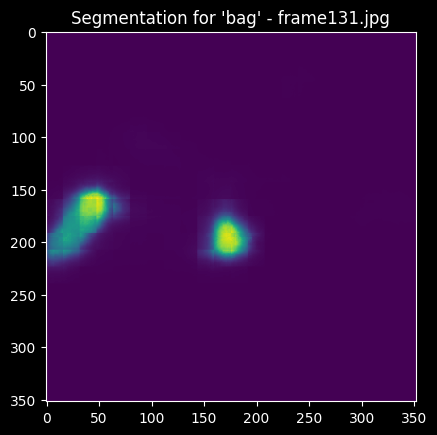

Unused or unrecognized kwargs: padding.


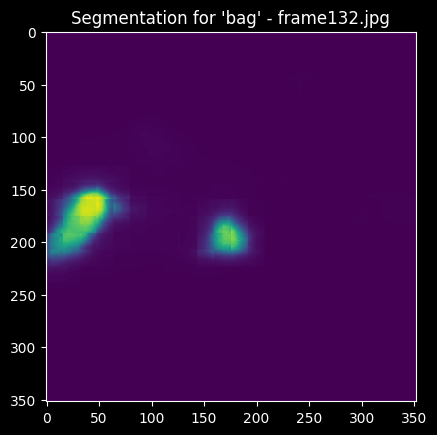

Unused or unrecognized kwargs: padding.


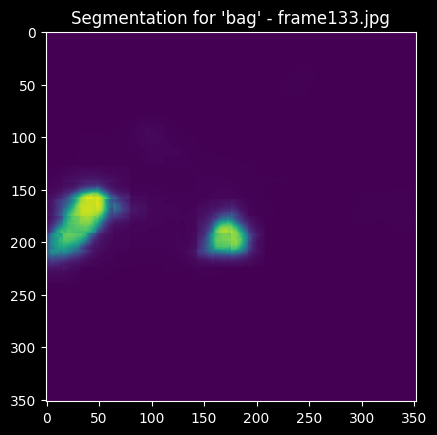

Unused or unrecognized kwargs: padding.


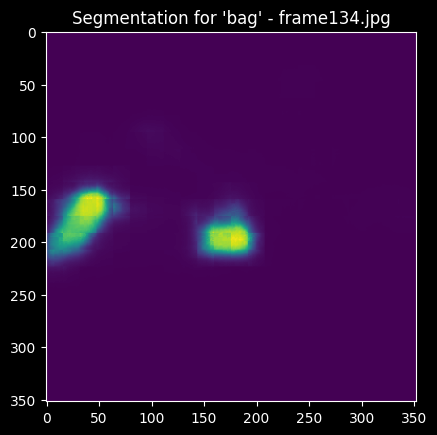

Unused or unrecognized kwargs: padding.


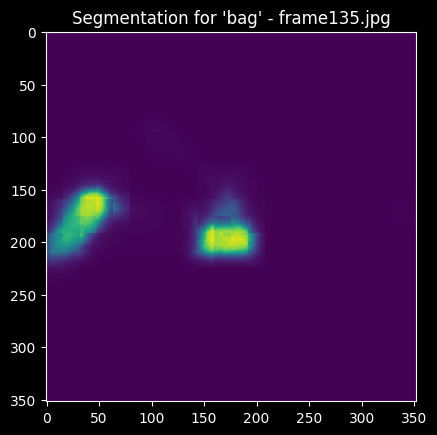

Unused or unrecognized kwargs: padding.


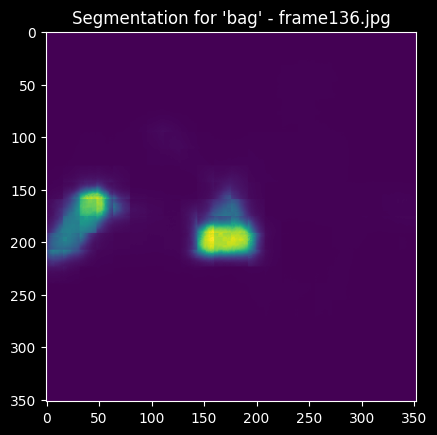

Unused or unrecognized kwargs: padding.


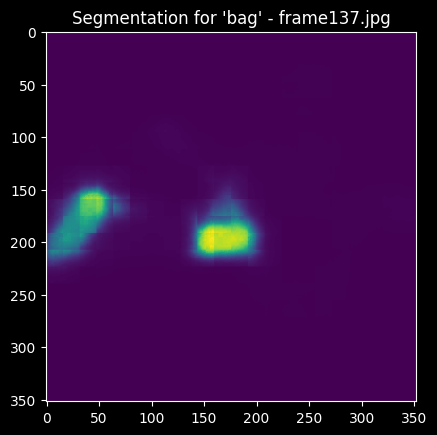

Unused or unrecognized kwargs: padding.


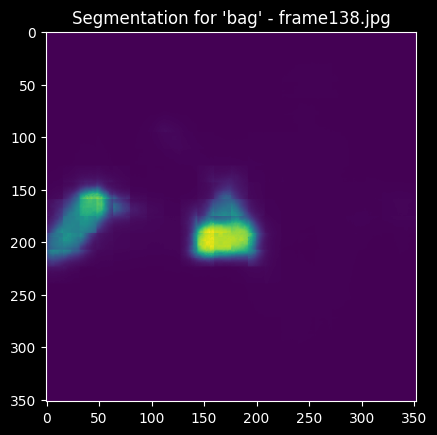

Unused or unrecognized kwargs: padding.


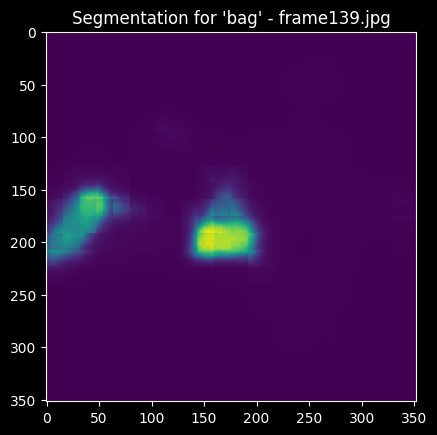

Unused or unrecognized kwargs: padding.


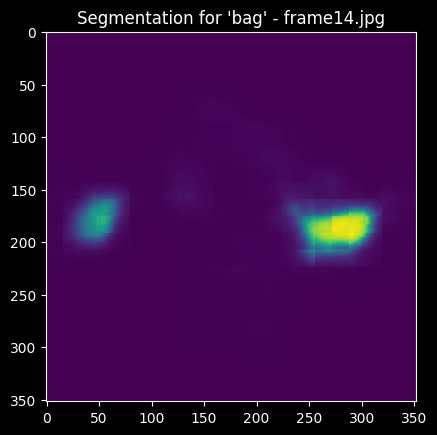

Unused or unrecognized kwargs: padding.


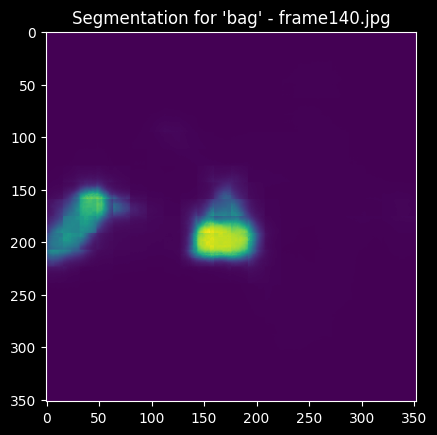

Unused or unrecognized kwargs: padding.


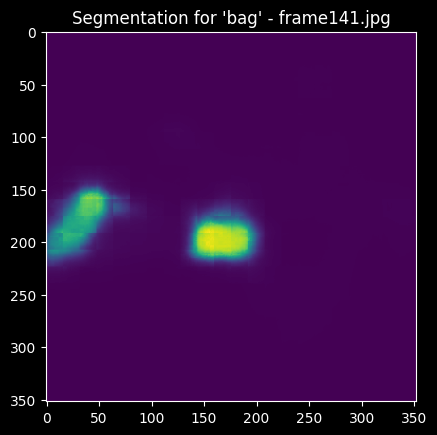

Unused or unrecognized kwargs: padding.


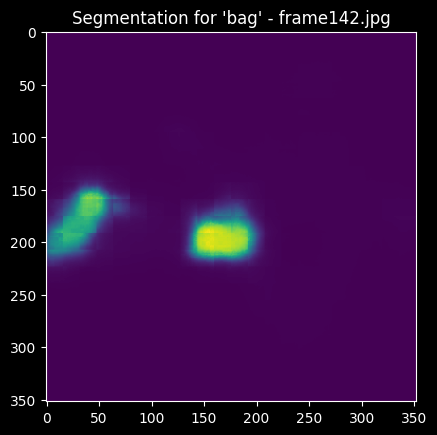

Unused or unrecognized kwargs: padding.


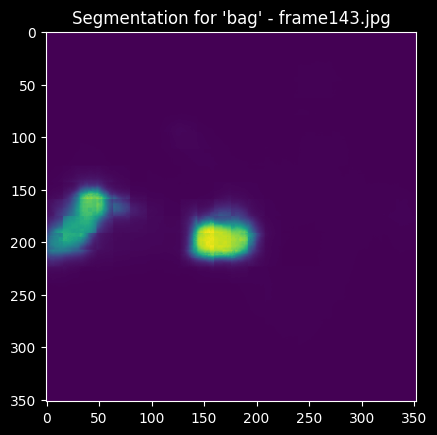

Unused or unrecognized kwargs: padding.


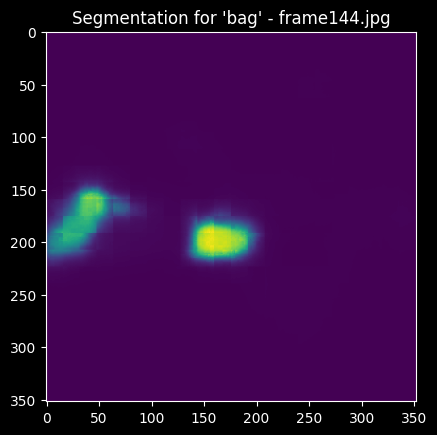

Unused or unrecognized kwargs: padding.


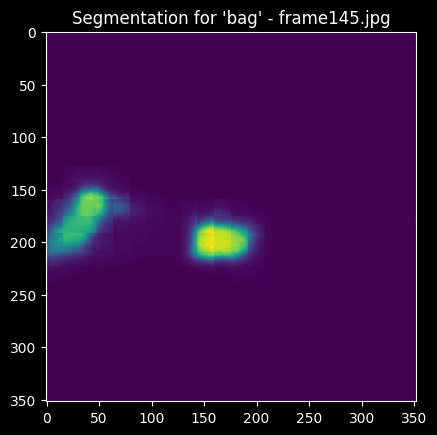

Unused or unrecognized kwargs: padding.


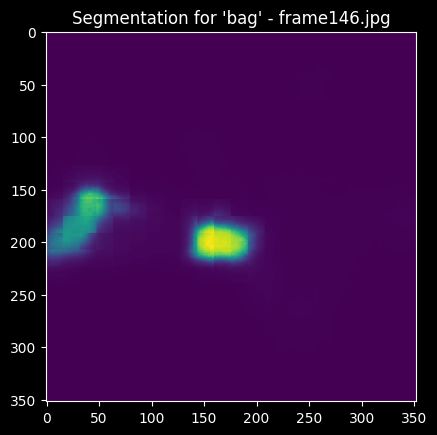

Unused or unrecognized kwargs: padding.


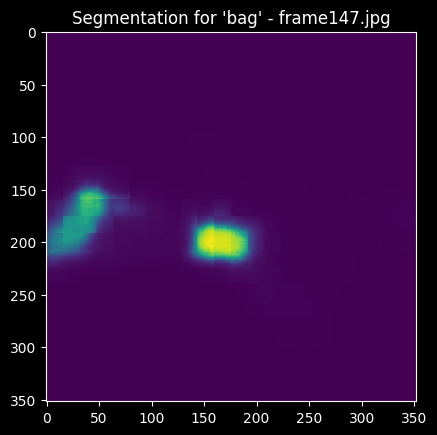

Unused or unrecognized kwargs: padding.


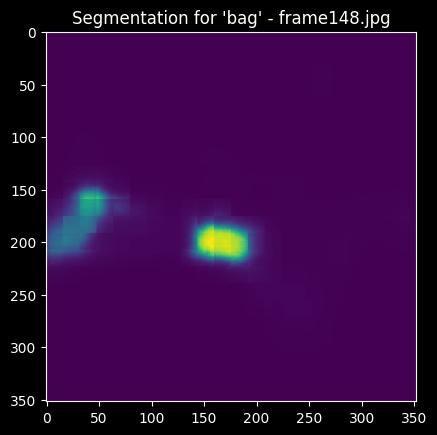

Unused or unrecognized kwargs: padding.


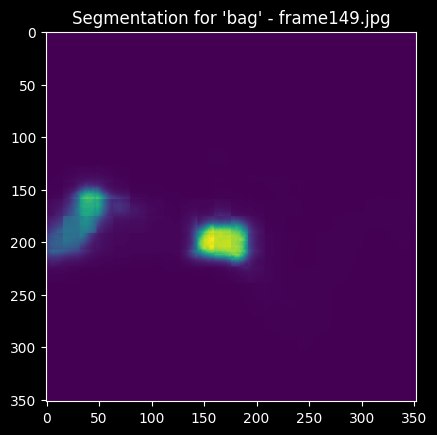

Unused or unrecognized kwargs: padding.


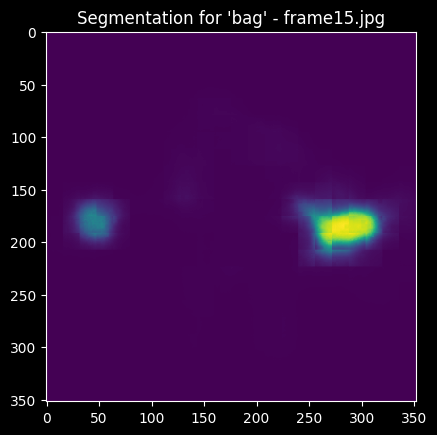

Unused or unrecognized kwargs: padding.


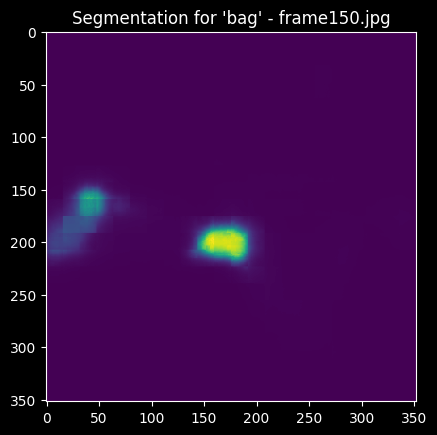

Unused or unrecognized kwargs: padding.


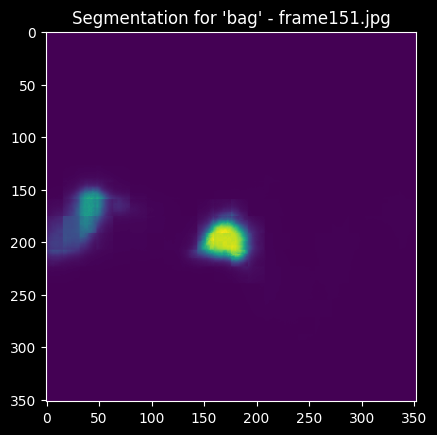

Unused or unrecognized kwargs: padding.


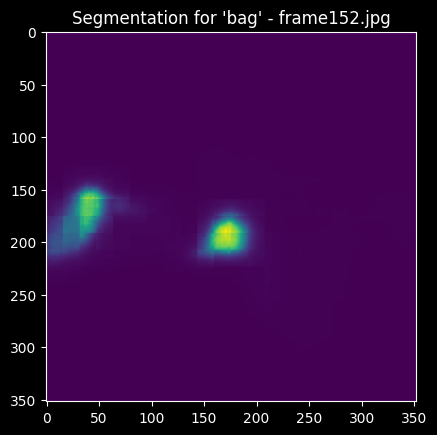

Unused or unrecognized kwargs: padding.


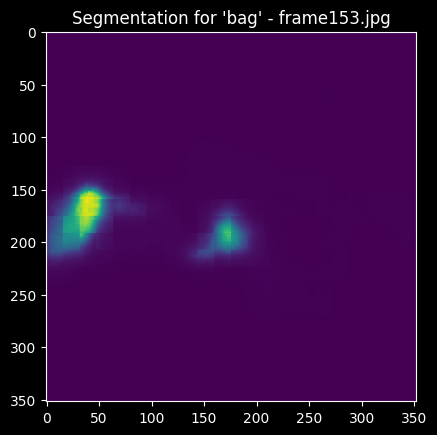

Unused or unrecognized kwargs: padding.


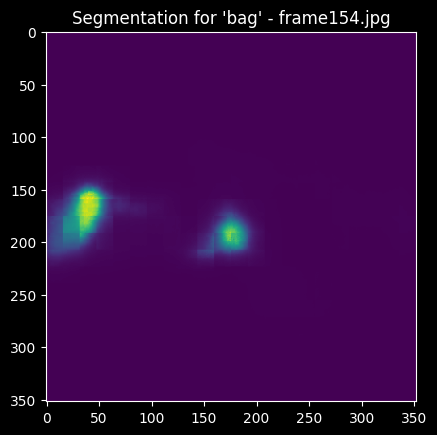

Unused or unrecognized kwargs: padding.


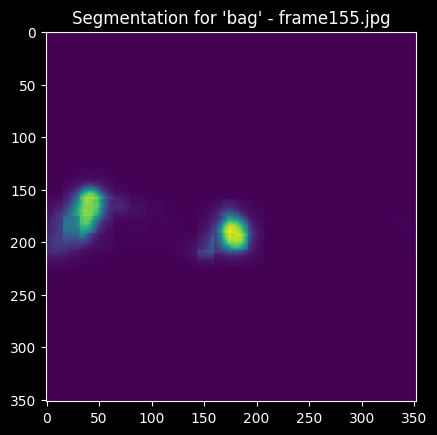

Unused or unrecognized kwargs: padding.


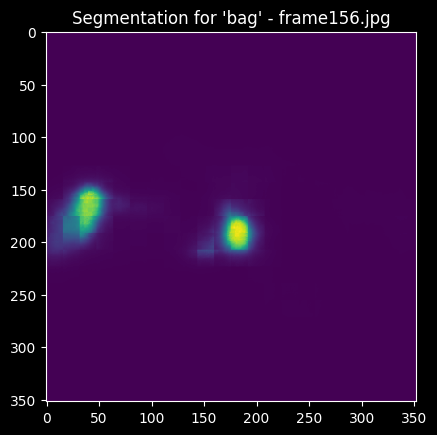

Unused or unrecognized kwargs: padding.


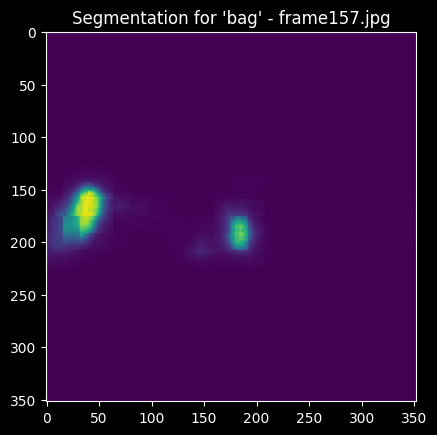

Unused or unrecognized kwargs: padding.


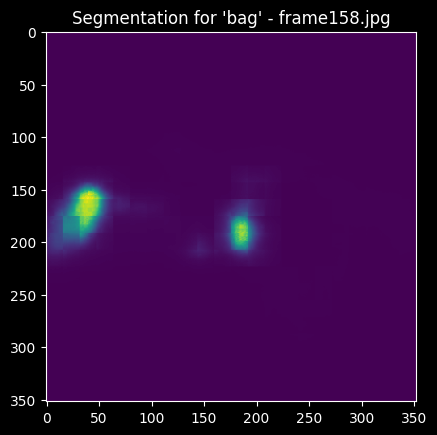

Unused or unrecognized kwargs: padding.


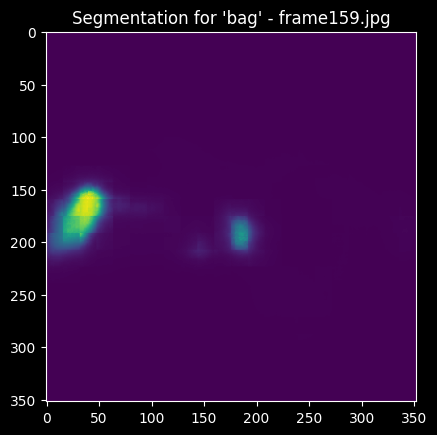

Unused or unrecognized kwargs: padding.


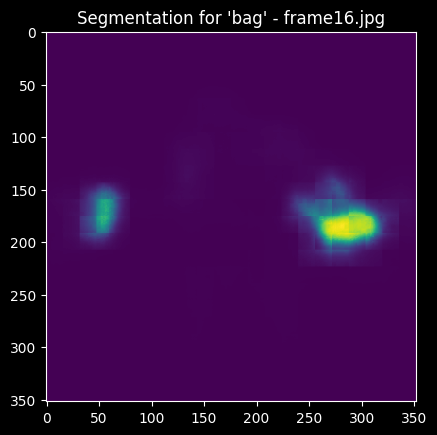

Unused or unrecognized kwargs: padding.


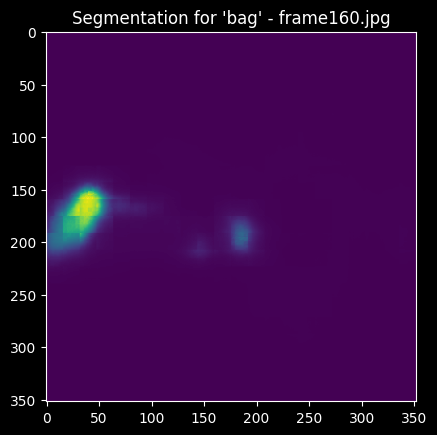

Unused or unrecognized kwargs: padding.


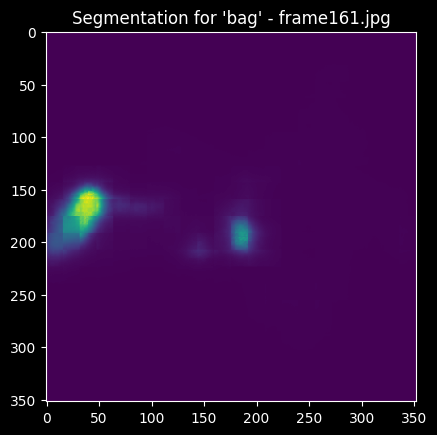

Unused or unrecognized kwargs: padding.


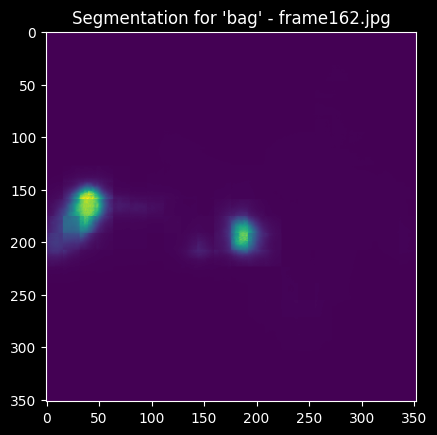

Unused or unrecognized kwargs: padding.


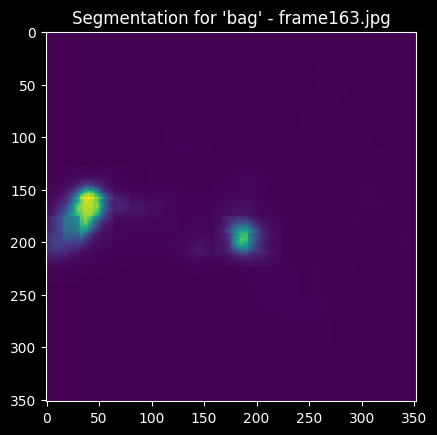

Unused or unrecognized kwargs: padding.


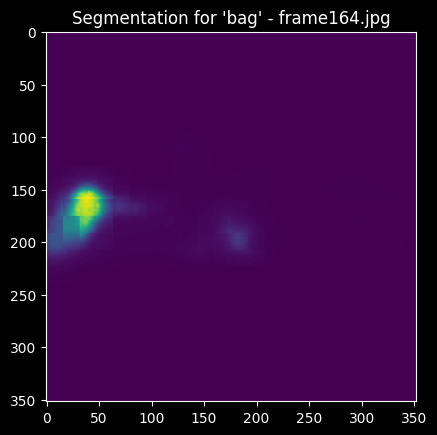

Unused or unrecognized kwargs: padding.


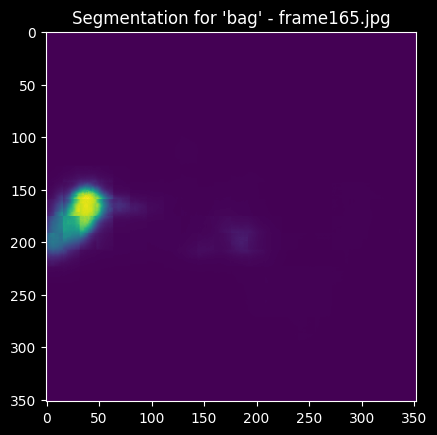

Unused or unrecognized kwargs: padding.


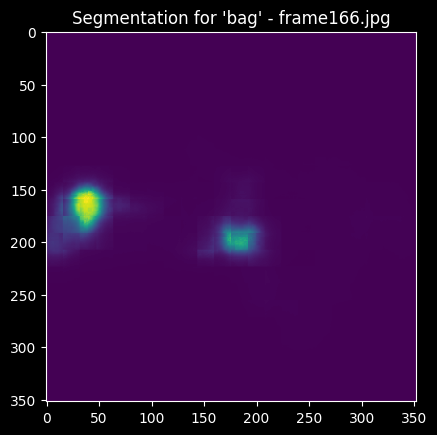

Unused or unrecognized kwargs: padding.


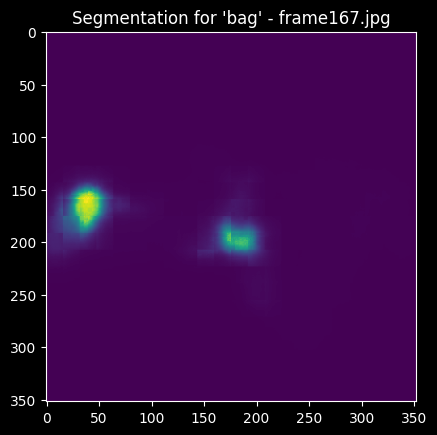

Unused or unrecognized kwargs: padding.


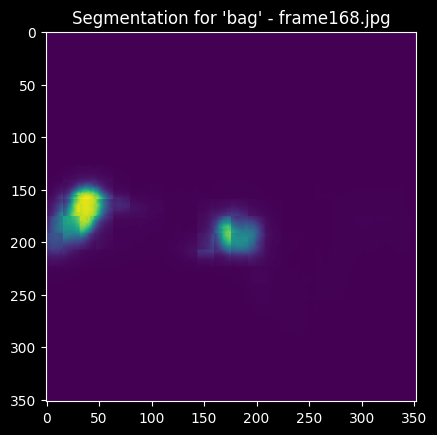

Unused or unrecognized kwargs: padding.


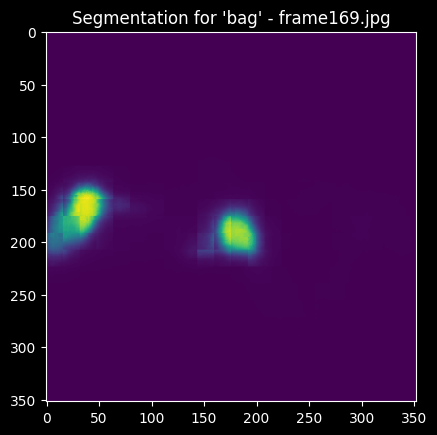

Unused or unrecognized kwargs: padding.


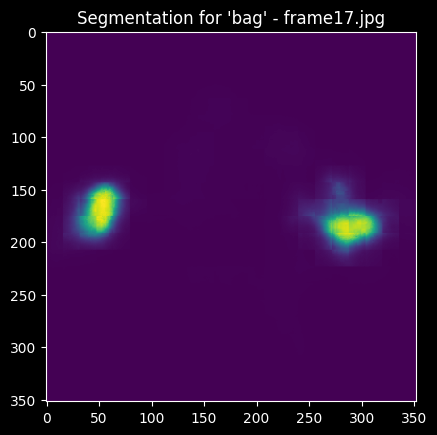

Unused or unrecognized kwargs: padding.


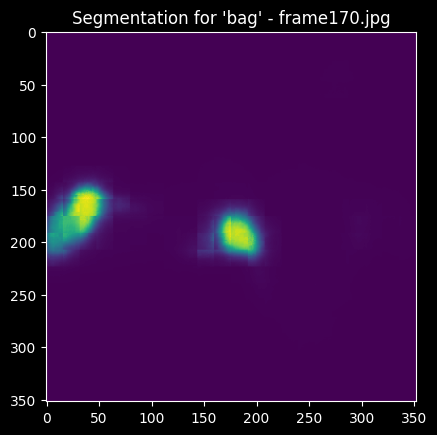

Unused or unrecognized kwargs: padding.


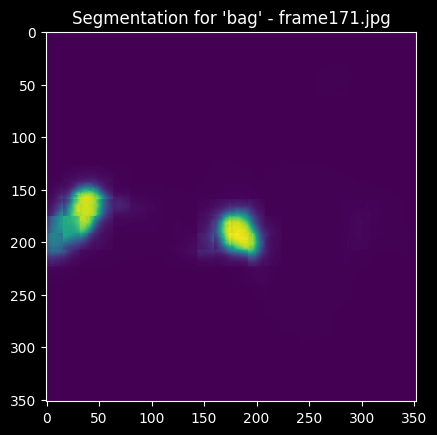

Unused or unrecognized kwargs: padding.


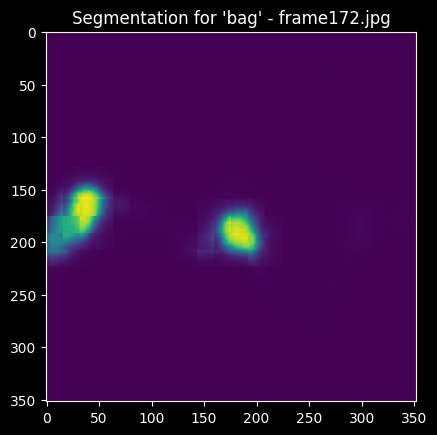

Unused or unrecognized kwargs: padding.


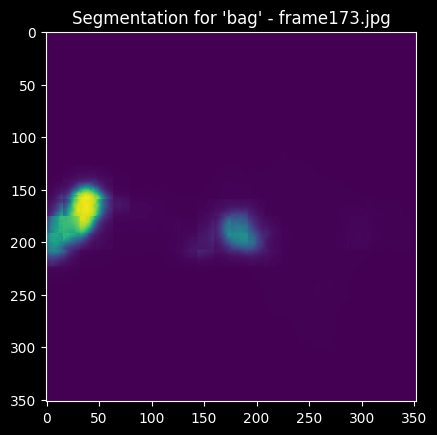

Unused or unrecognized kwargs: padding.


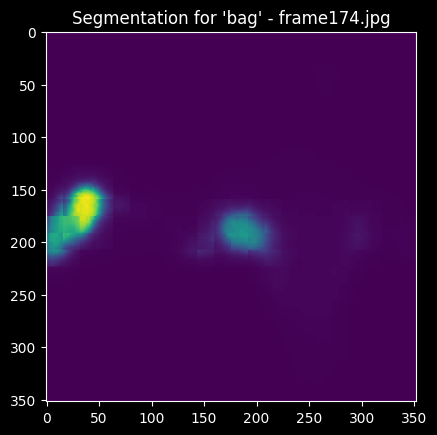

Unused or unrecognized kwargs: padding.


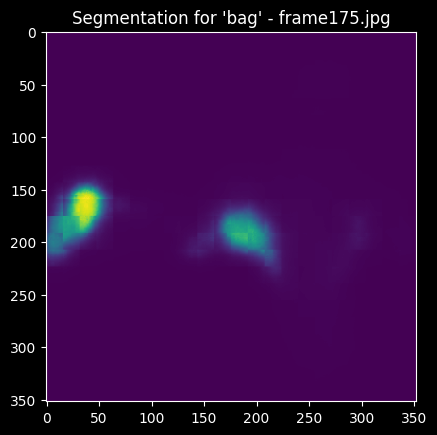

Unused or unrecognized kwargs: padding.


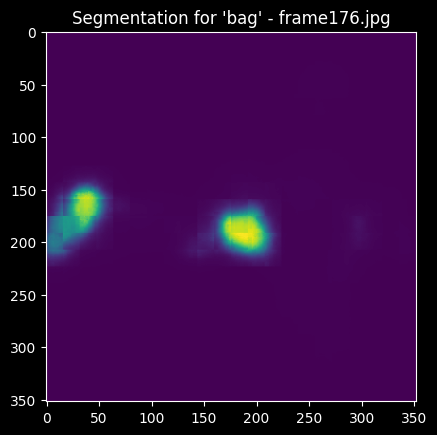

Unused or unrecognized kwargs: padding.


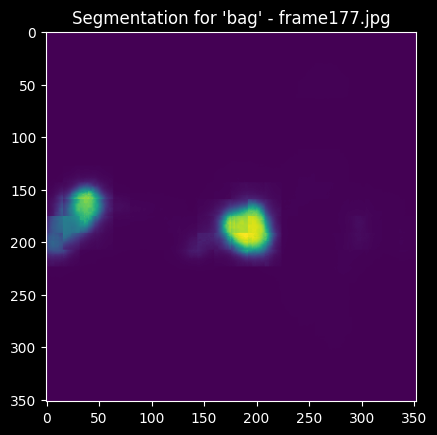

Unused or unrecognized kwargs: padding.


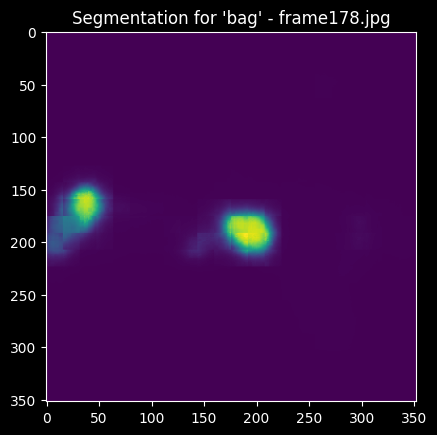

Unused or unrecognized kwargs: padding.


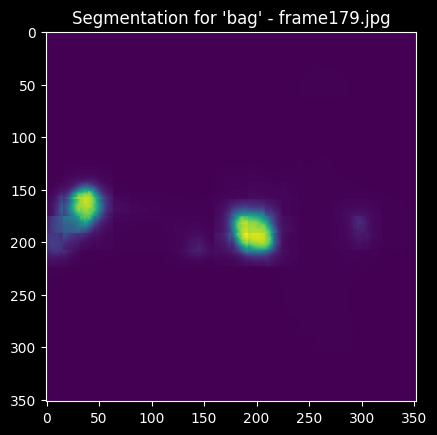

Unused or unrecognized kwargs: padding.


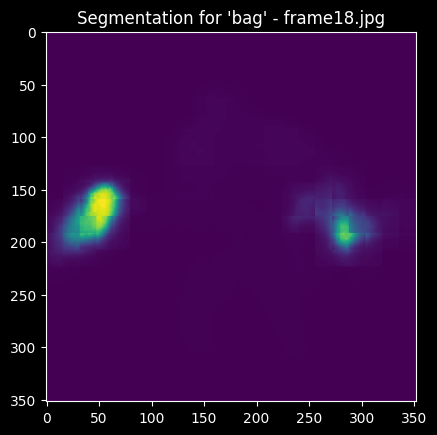

Unused or unrecognized kwargs: padding.


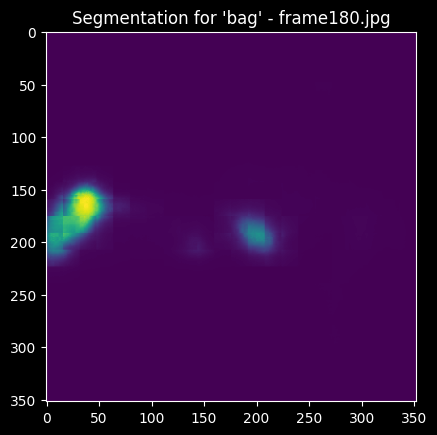

Unused or unrecognized kwargs: padding.


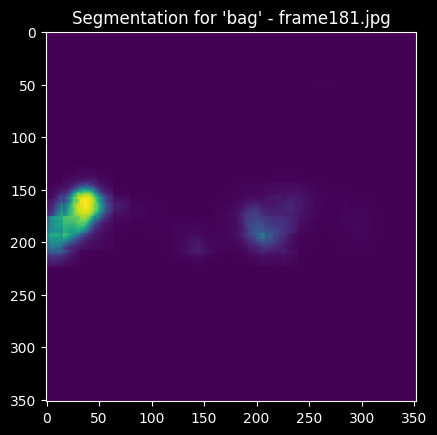

Unused or unrecognized kwargs: padding.


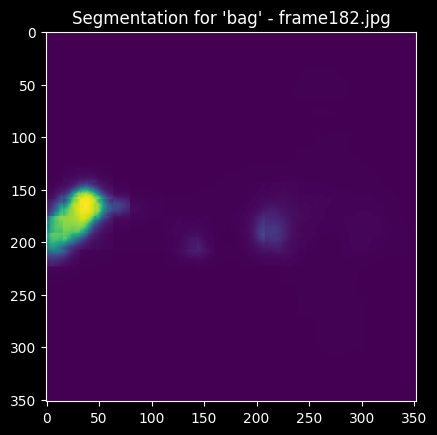

Unused or unrecognized kwargs: padding.


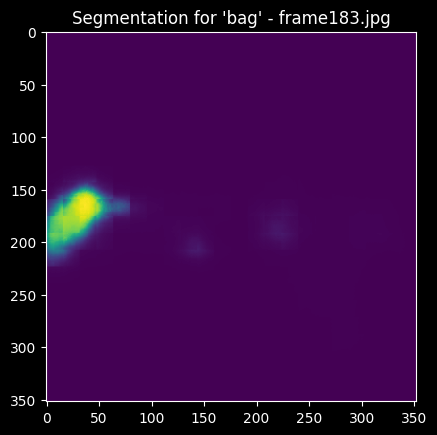

Unused or unrecognized kwargs: padding.


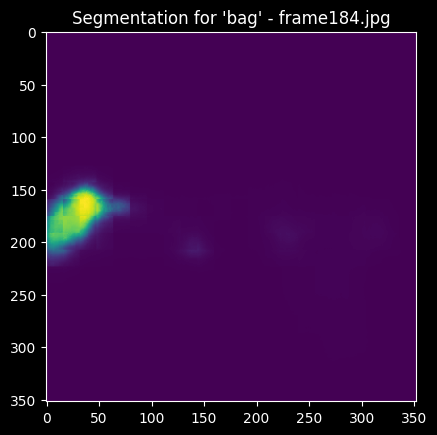

Unused or unrecognized kwargs: padding.


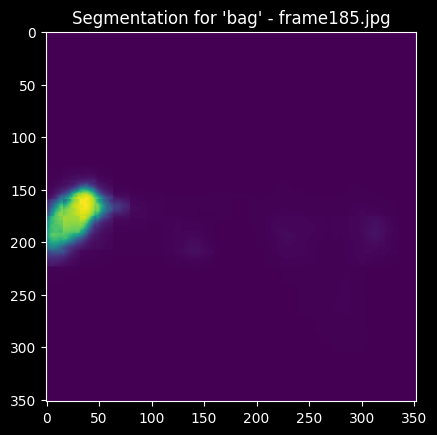

Unused or unrecognized kwargs: padding.


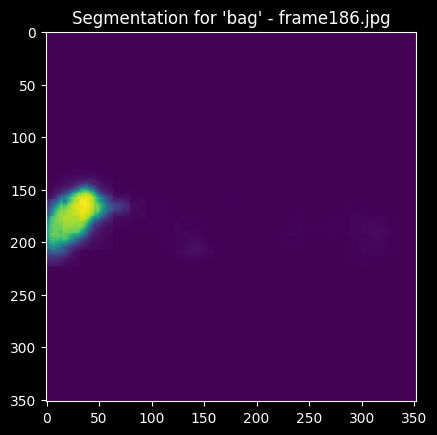

Unused or unrecognized kwargs: padding.


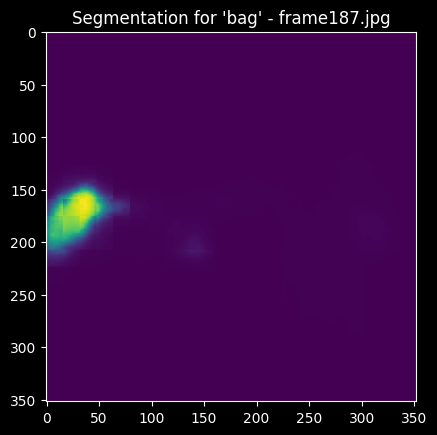

Unused or unrecognized kwargs: padding.


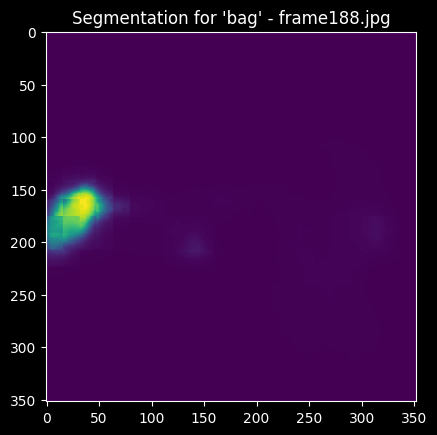

Unused or unrecognized kwargs: padding.


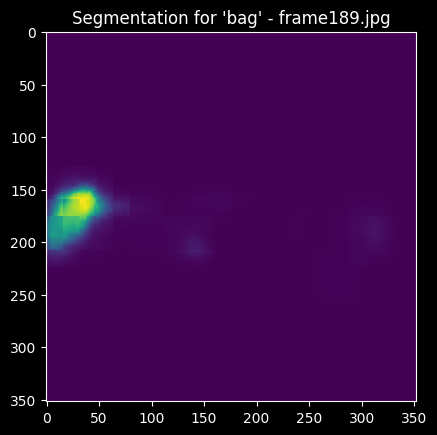

Unused or unrecognized kwargs: padding.


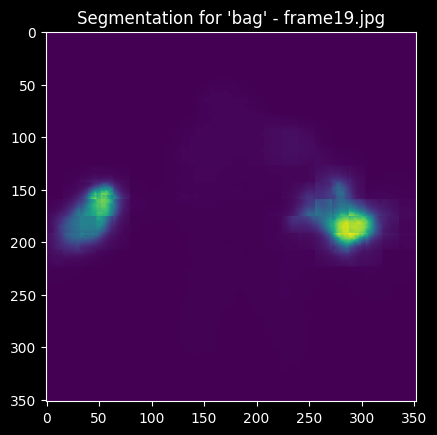

Unused or unrecognized kwargs: padding.


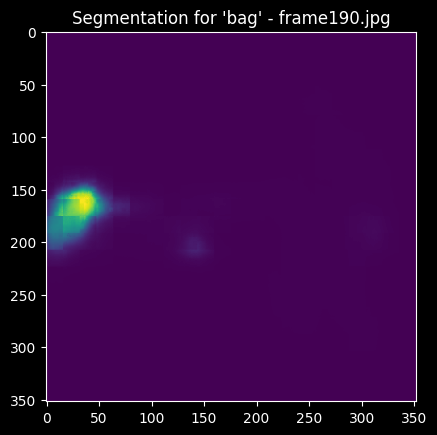

Unused or unrecognized kwargs: padding.


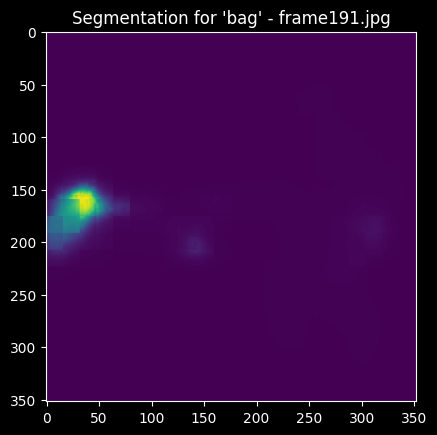

Unused or unrecognized kwargs: padding.


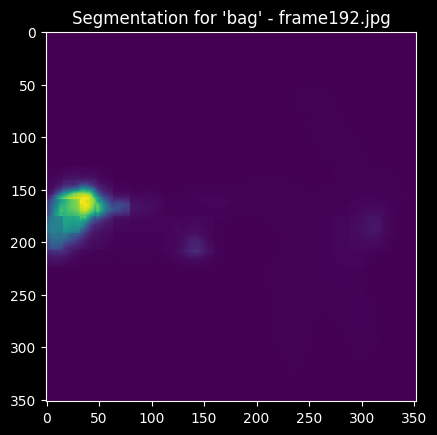

Unused or unrecognized kwargs: padding.


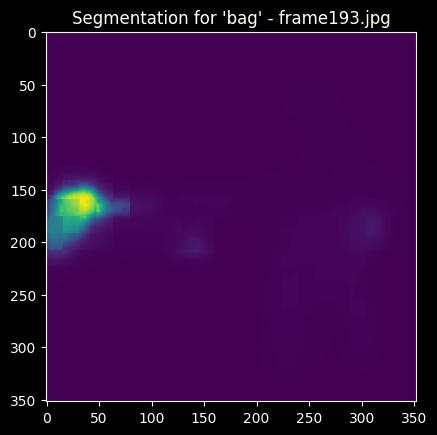

Unused or unrecognized kwargs: padding.


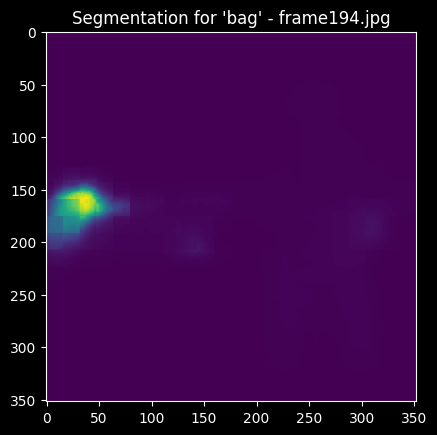

Unused or unrecognized kwargs: padding.


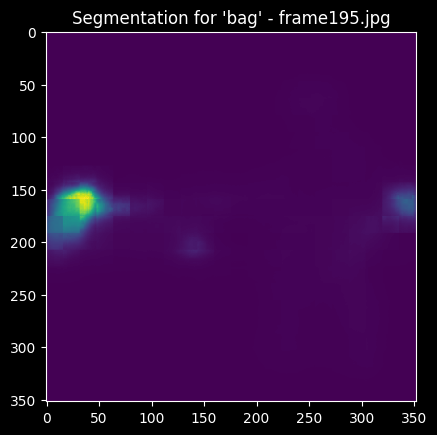

Unused or unrecognized kwargs: padding.


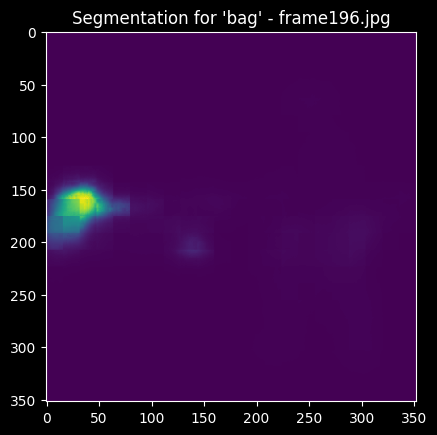

Unused or unrecognized kwargs: padding.


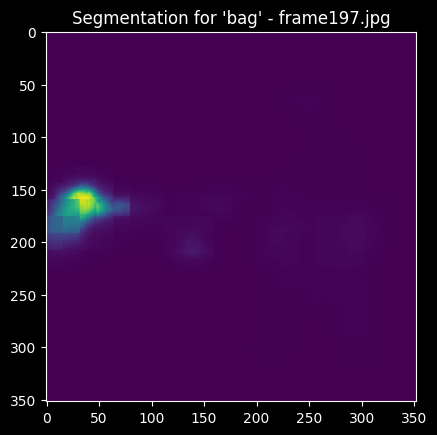

Unused or unrecognized kwargs: padding.


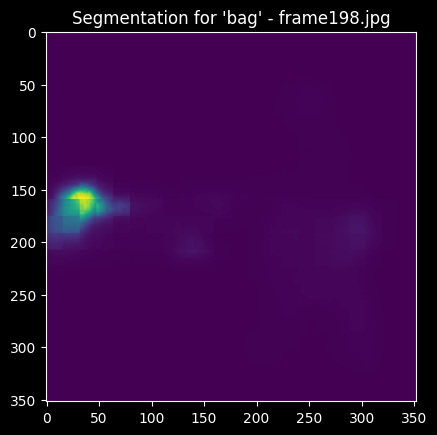

Unused or unrecognized kwargs: padding.


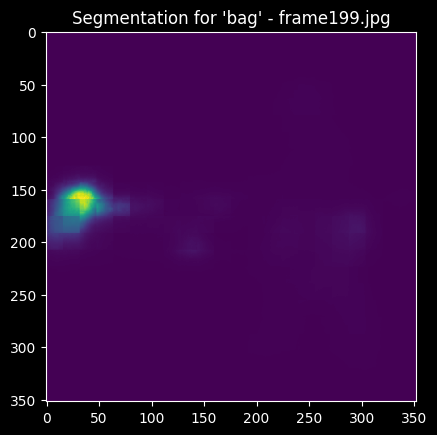

Unused or unrecognized kwargs: padding.


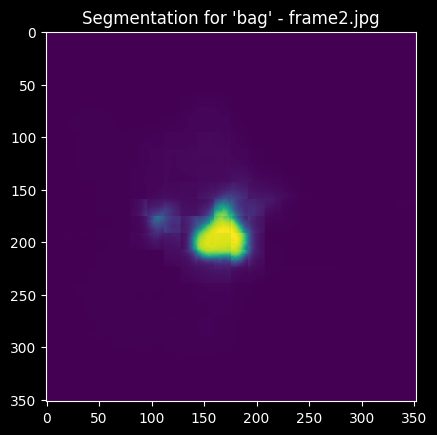

Unused or unrecognized kwargs: padding.


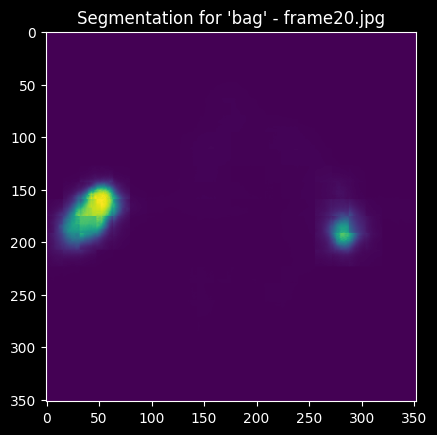

Unused or unrecognized kwargs: padding.


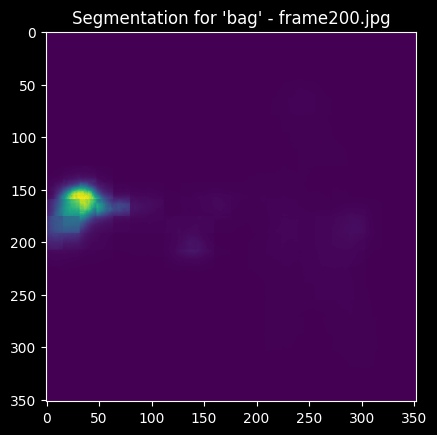

Unused or unrecognized kwargs: padding.


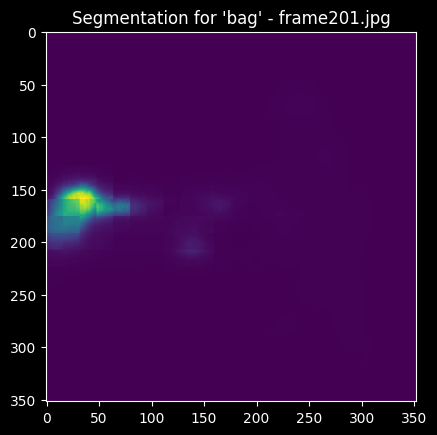

Unused or unrecognized kwargs: padding.


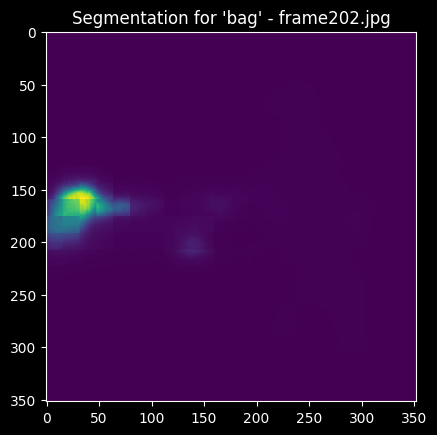

Unused or unrecognized kwargs: padding.


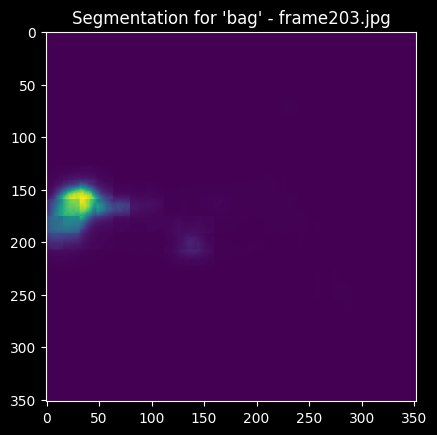

Unused or unrecognized kwargs: padding.


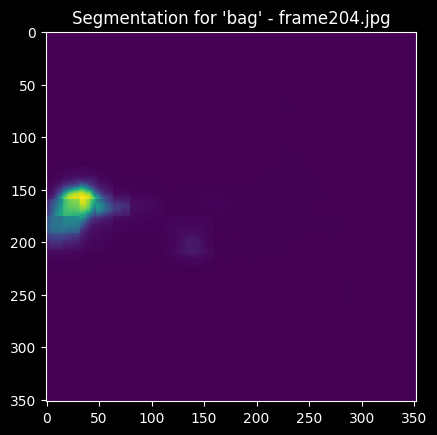

Unused or unrecognized kwargs: padding.


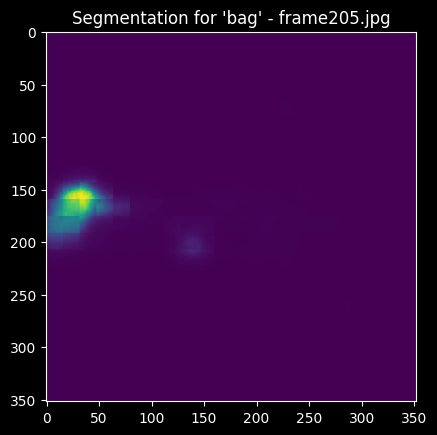

Unused or unrecognized kwargs: padding.


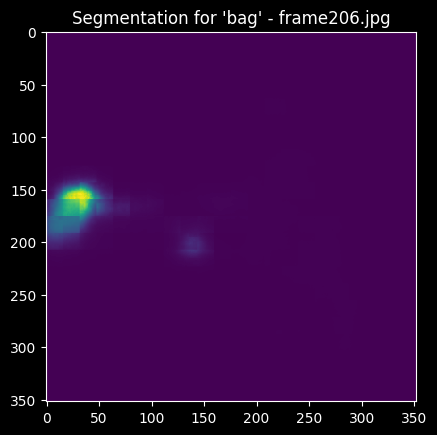

Unused or unrecognized kwargs: padding.


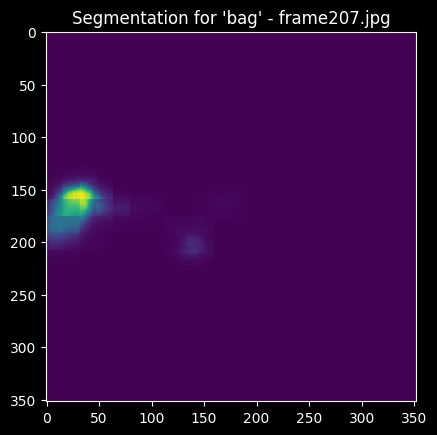

Unused or unrecognized kwargs: padding.


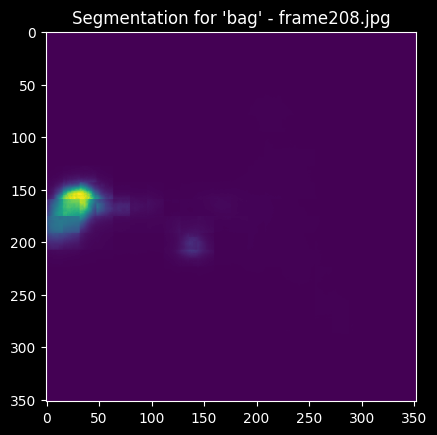

Unused or unrecognized kwargs: padding.


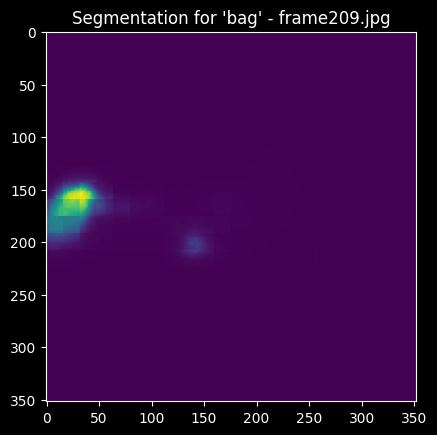

Unused or unrecognized kwargs: padding.


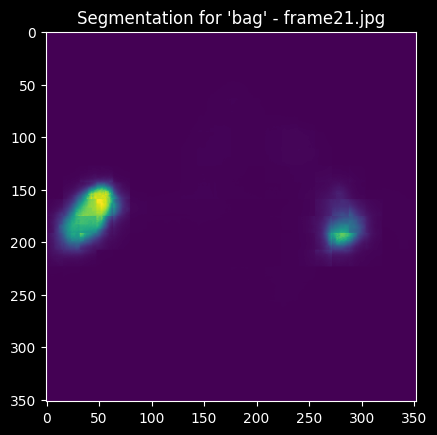

Unused or unrecognized kwargs: padding.


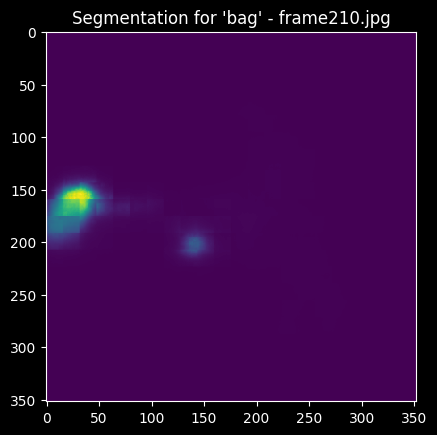

Unused or unrecognized kwargs: padding.


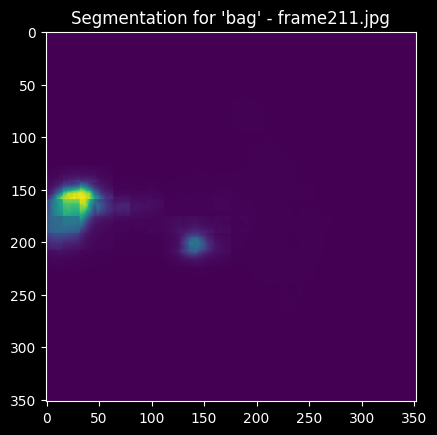

Unused or unrecognized kwargs: padding.


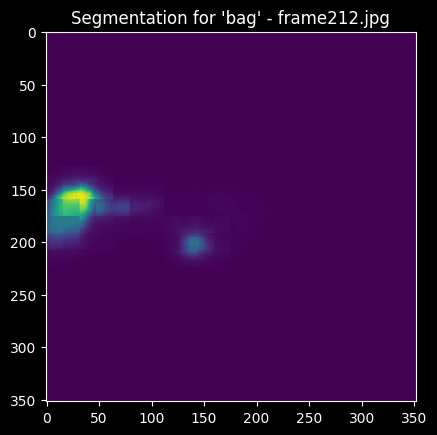

Unused or unrecognized kwargs: padding.


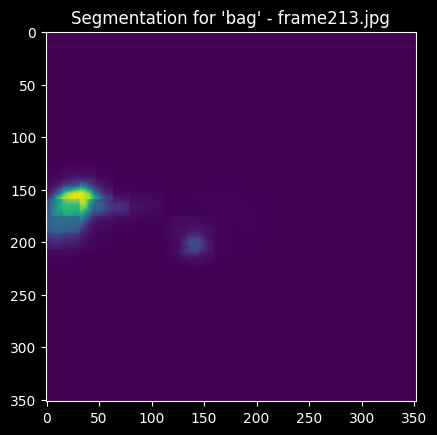

Unused or unrecognized kwargs: padding.


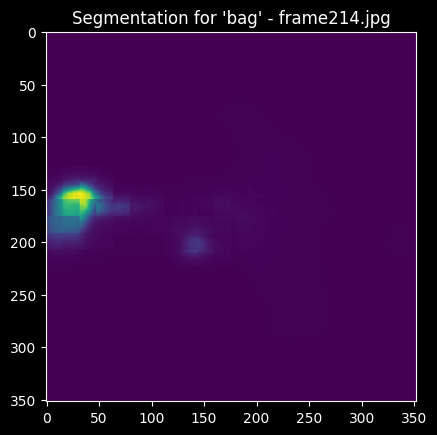

Unused or unrecognized kwargs: padding.


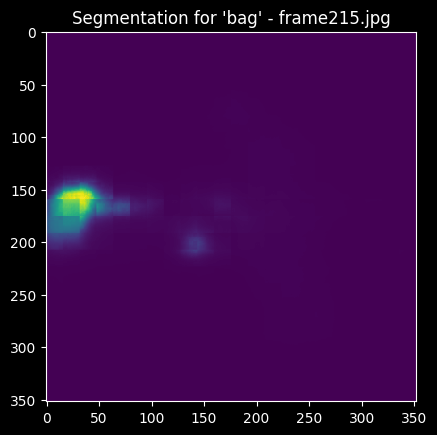

Unused or unrecognized kwargs: padding.


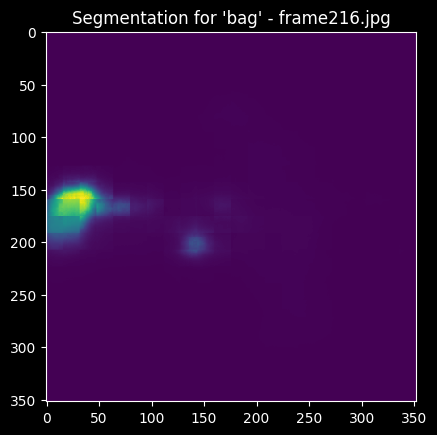

Unused or unrecognized kwargs: padding.


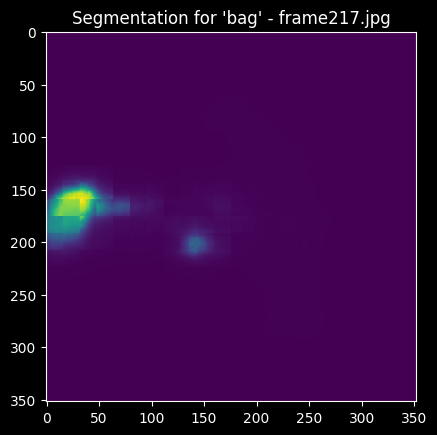

Unused or unrecognized kwargs: padding.


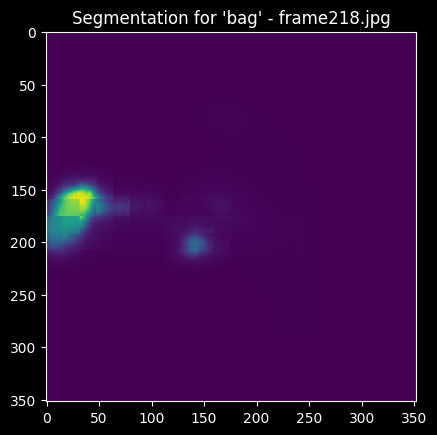

Unused or unrecognized kwargs: padding.


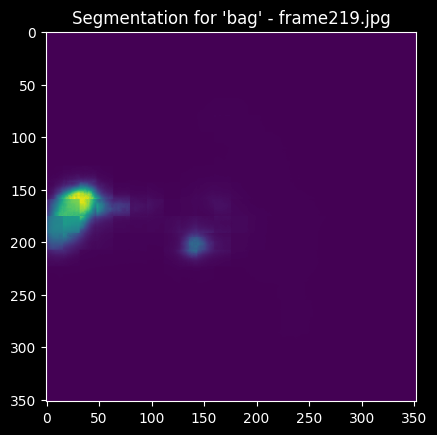

Unused or unrecognized kwargs: padding.


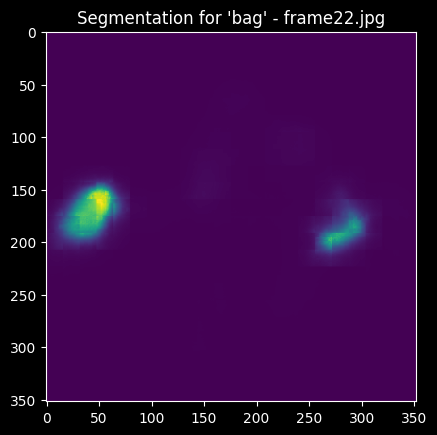

Unused or unrecognized kwargs: padding.


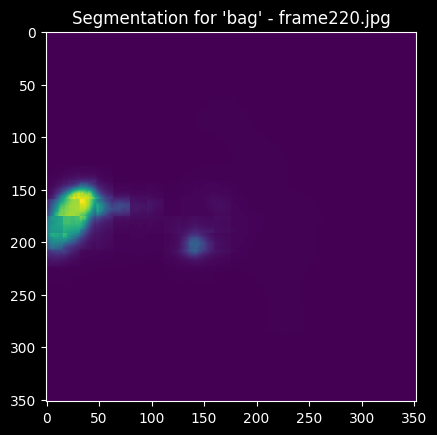

Unused or unrecognized kwargs: padding.


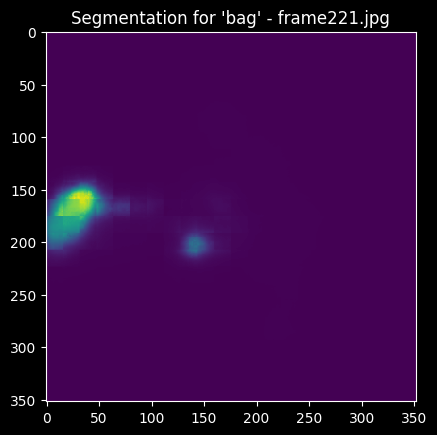

Unused or unrecognized kwargs: padding.


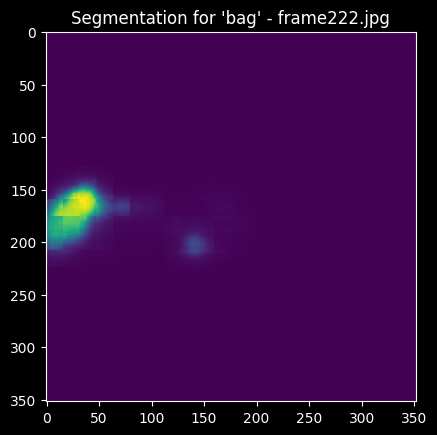

Unused or unrecognized kwargs: padding.


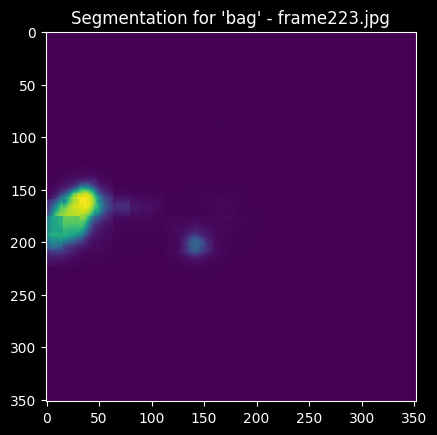

Unused or unrecognized kwargs: padding.


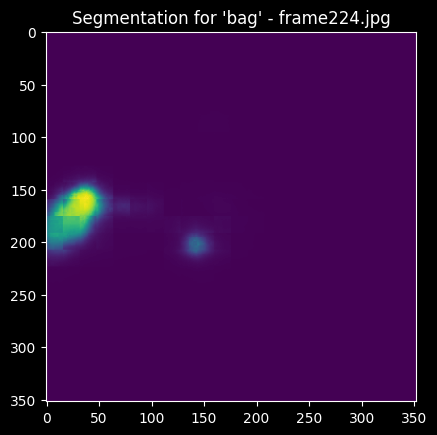

Unused or unrecognized kwargs: padding.


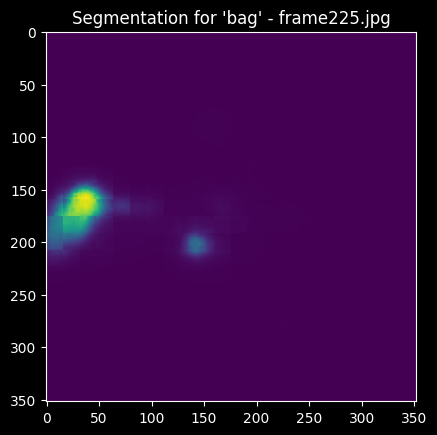

Unused or unrecognized kwargs: padding.


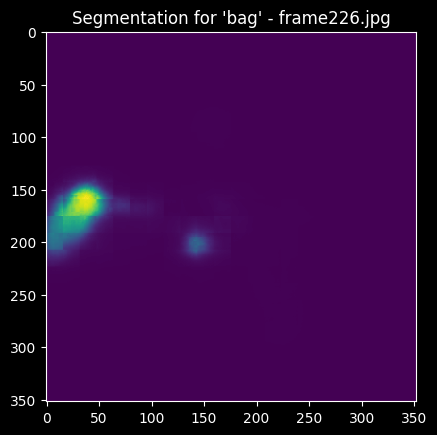

Unused or unrecognized kwargs: padding.


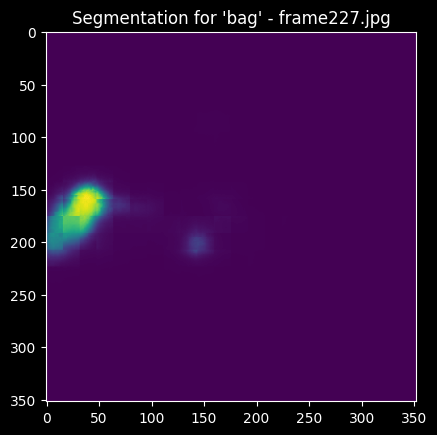

Unused or unrecognized kwargs: padding.


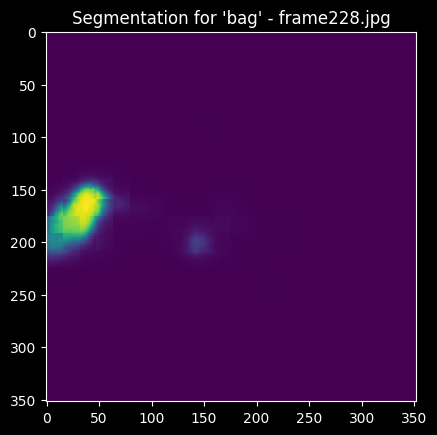

Unused or unrecognized kwargs: padding.


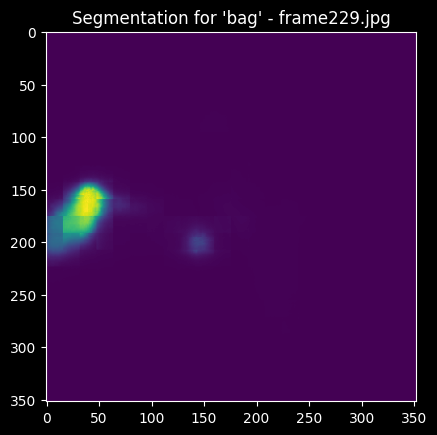

Unused or unrecognized kwargs: padding.


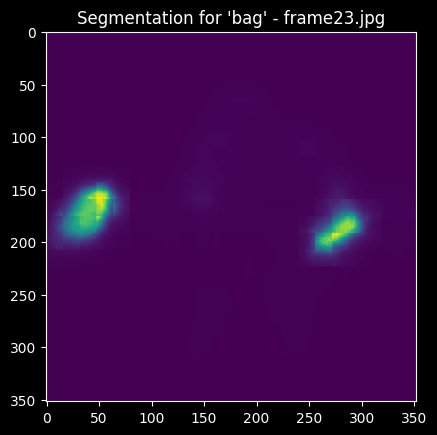

Unused or unrecognized kwargs: padding.


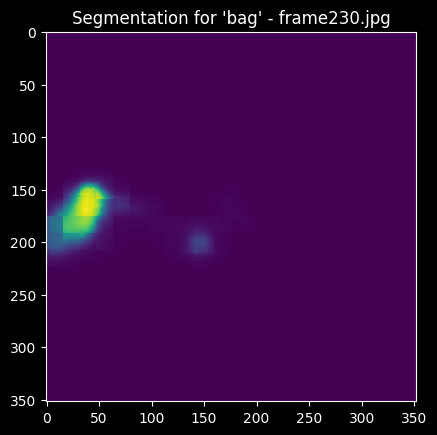

Unused or unrecognized kwargs: padding.


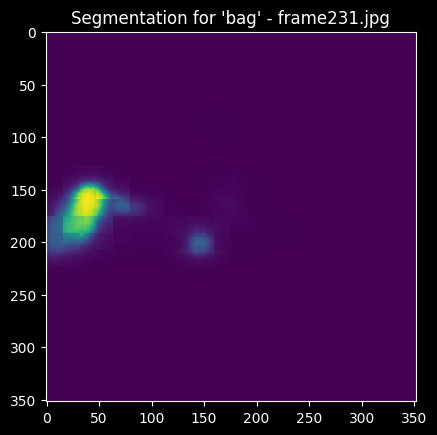

Unused or unrecognized kwargs: padding.


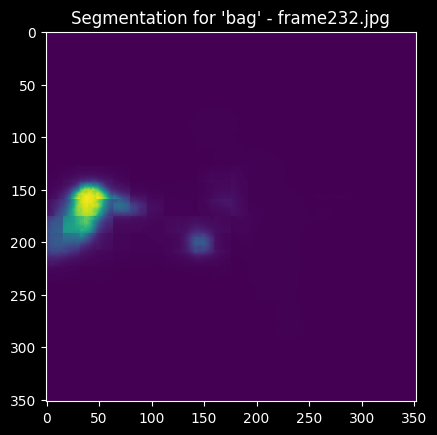

Unused or unrecognized kwargs: padding.


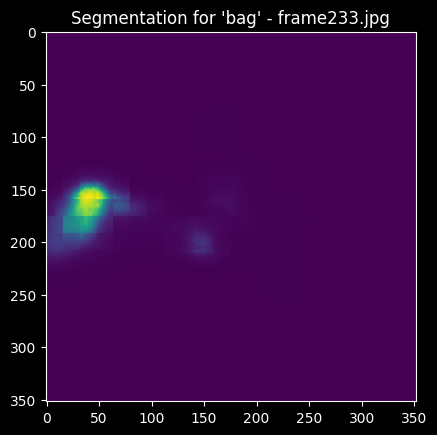

Unused or unrecognized kwargs: padding.


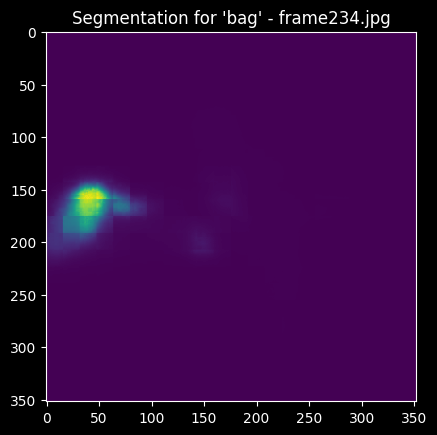

Unused or unrecognized kwargs: padding.


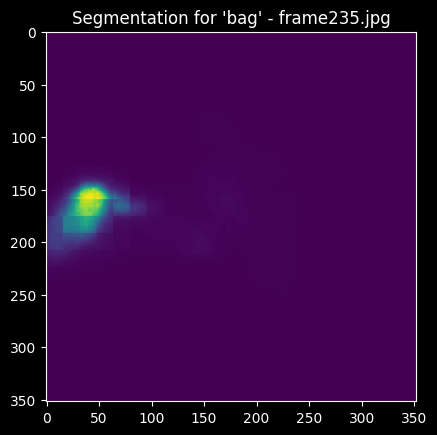

Unused or unrecognized kwargs: padding.


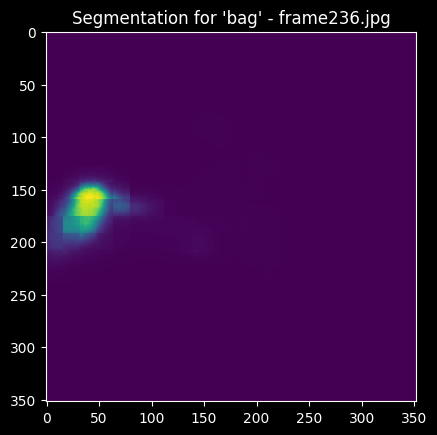

Unused or unrecognized kwargs: padding.


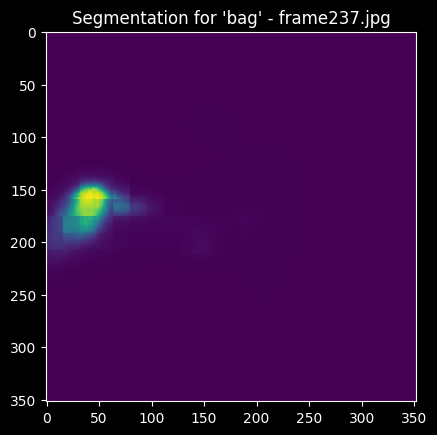

Unused or unrecognized kwargs: padding.


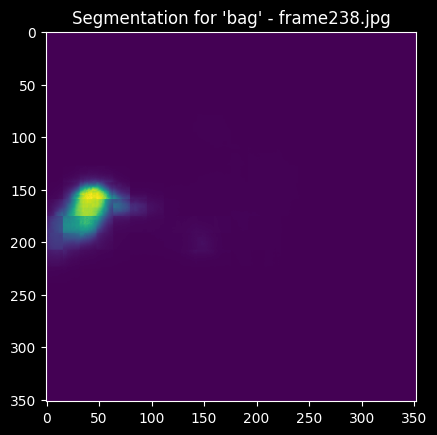

Unused or unrecognized kwargs: padding.


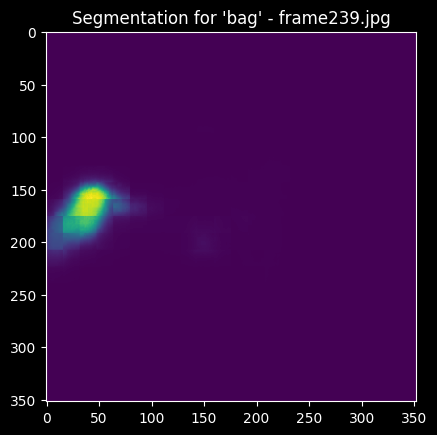

Unused or unrecognized kwargs: padding.


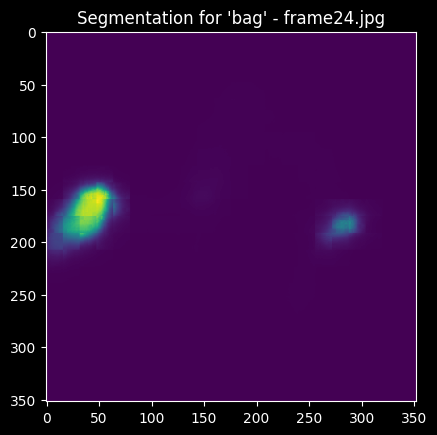

Unused or unrecognized kwargs: padding.


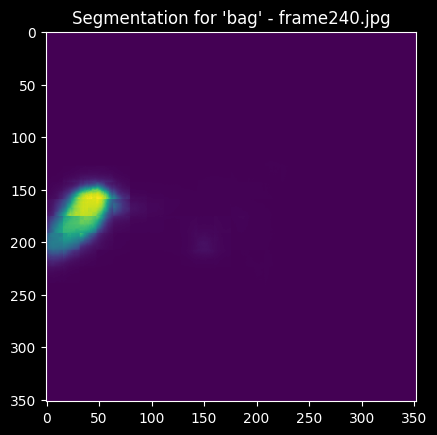

Unused or unrecognized kwargs: padding.


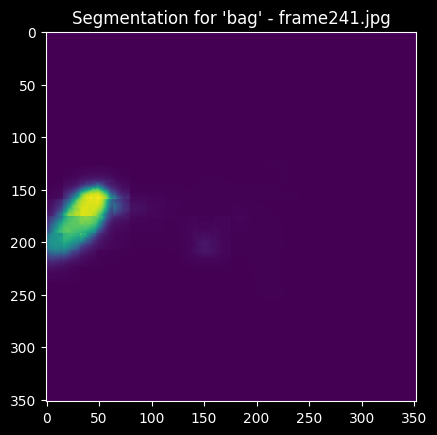

Unused or unrecognized kwargs: padding.


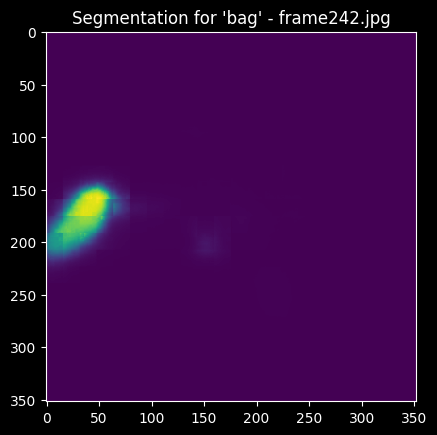

Unused or unrecognized kwargs: padding.


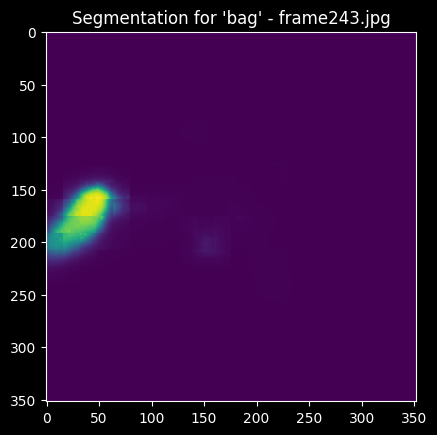

Unused or unrecognized kwargs: padding.


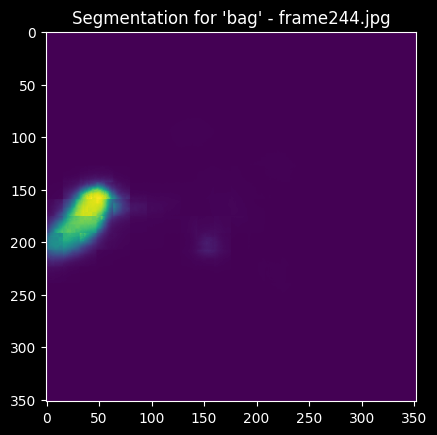

Unused or unrecognized kwargs: padding.


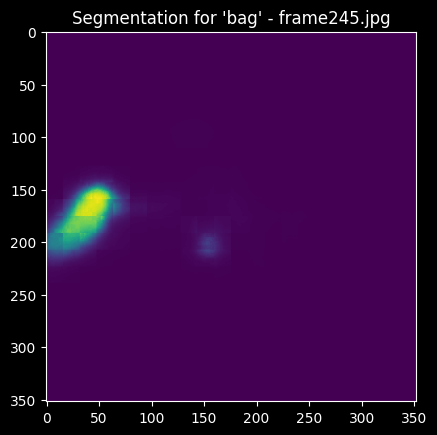

Unused or unrecognized kwargs: padding.


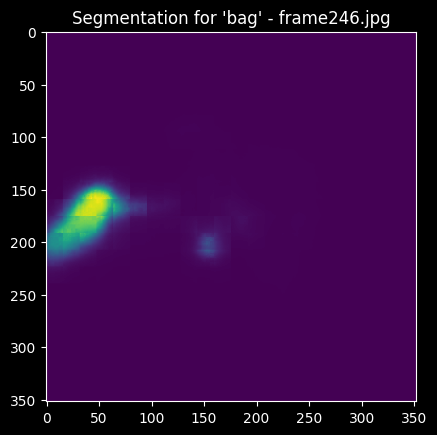

Unused or unrecognized kwargs: padding.


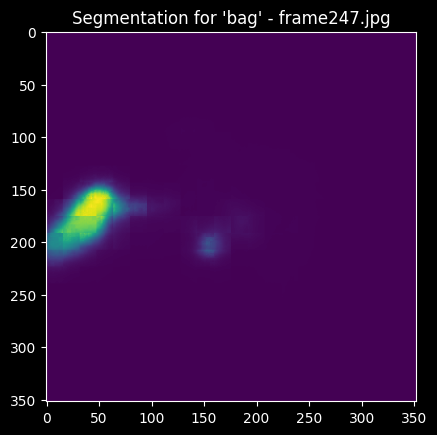

Unused or unrecognized kwargs: padding.


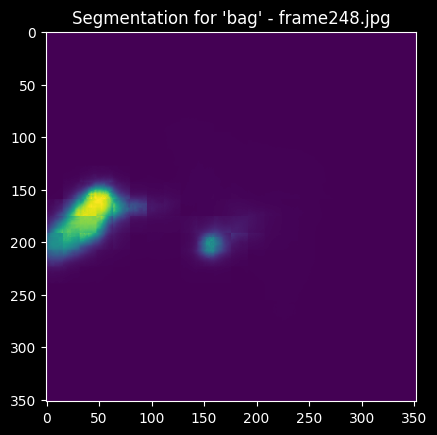

Unused or unrecognized kwargs: padding.


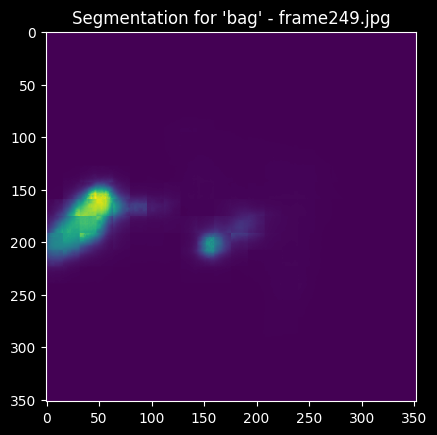

Unused or unrecognized kwargs: padding.


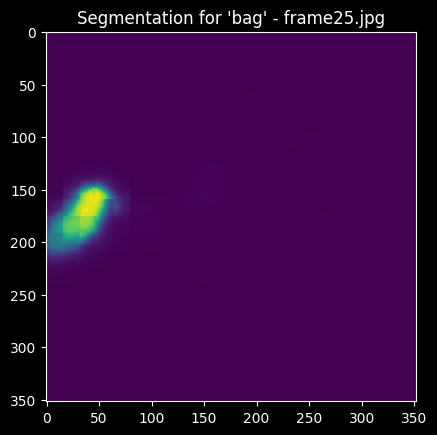

Unused or unrecognized kwargs: padding.


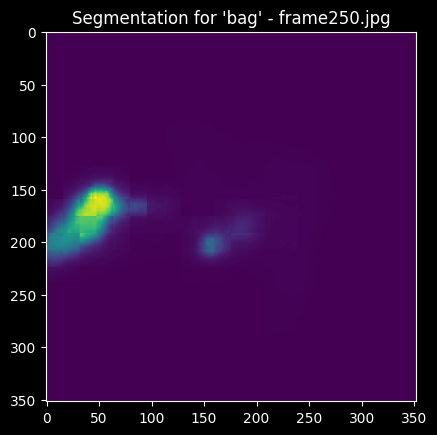

Unused or unrecognized kwargs: padding.


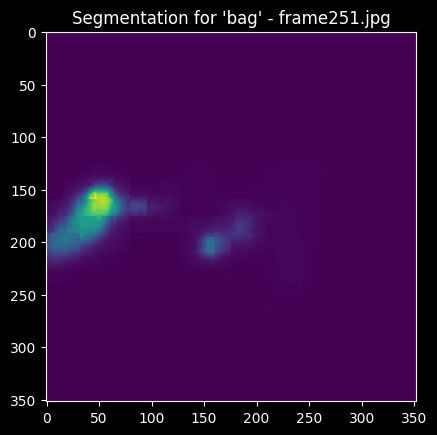

Unused or unrecognized kwargs: padding.


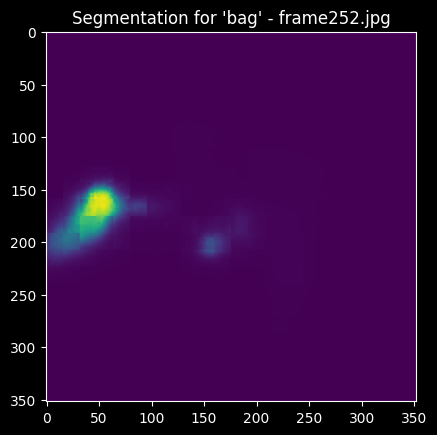

Unused or unrecognized kwargs: padding.


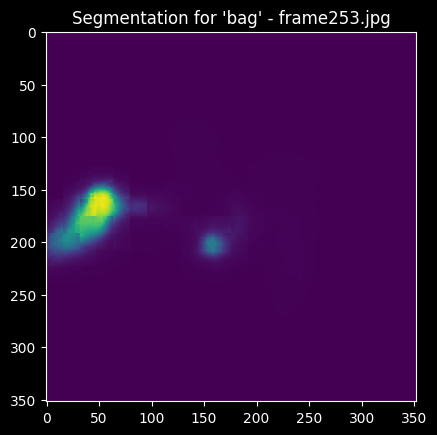

Unused or unrecognized kwargs: padding.


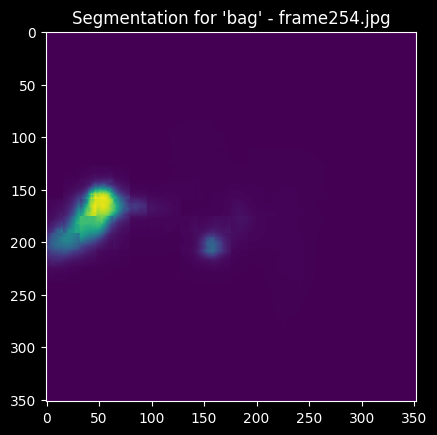

Unused or unrecognized kwargs: padding.


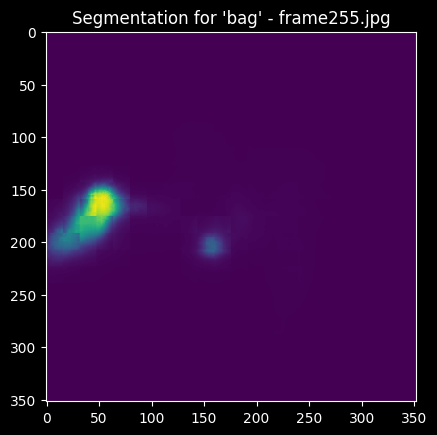

Unused or unrecognized kwargs: padding.


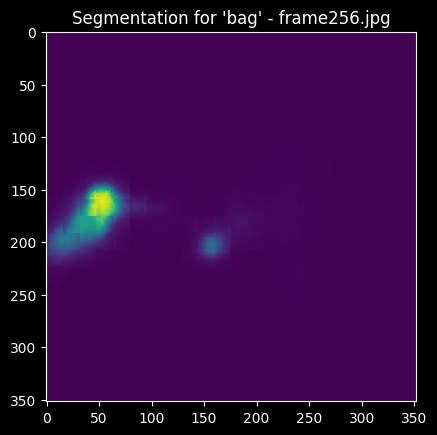

Unused or unrecognized kwargs: padding.


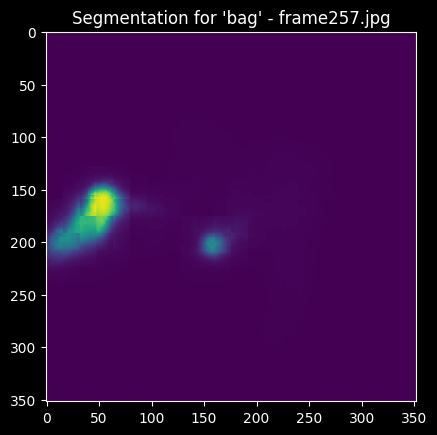

Unused or unrecognized kwargs: padding.


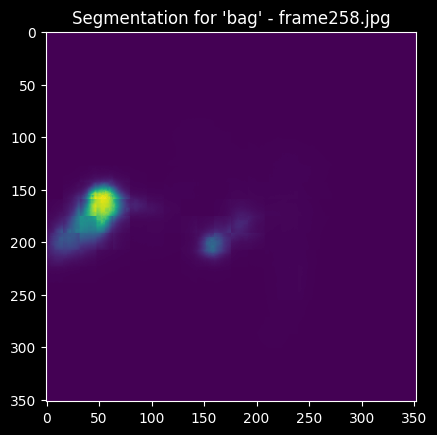

Unused or unrecognized kwargs: padding.


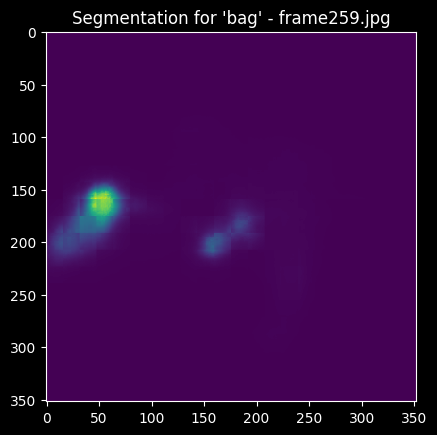

Unused or unrecognized kwargs: padding.


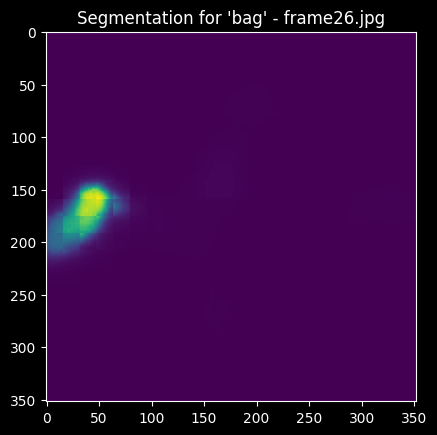

Unused or unrecognized kwargs: padding.


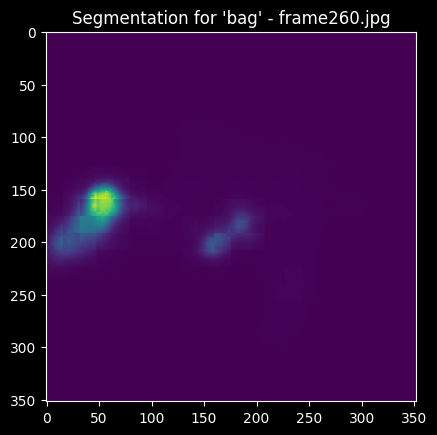

Unused or unrecognized kwargs: padding.


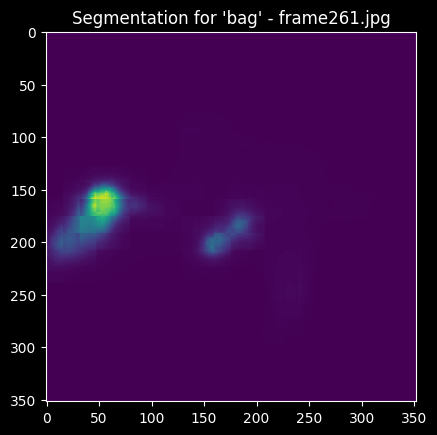

Unused or unrecognized kwargs: padding.


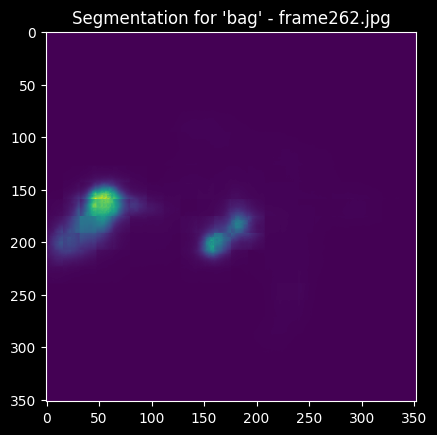

Unused or unrecognized kwargs: padding.


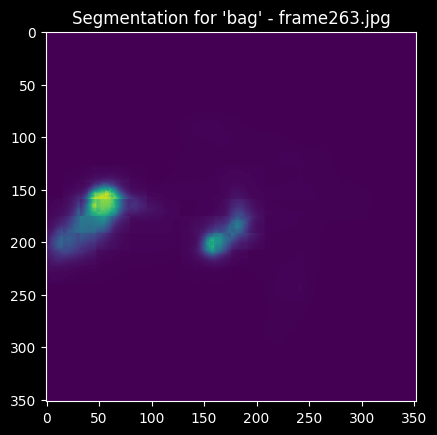

Unused or unrecognized kwargs: padding.


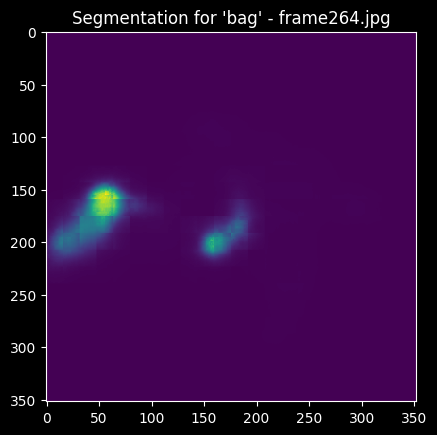

Unused or unrecognized kwargs: padding.


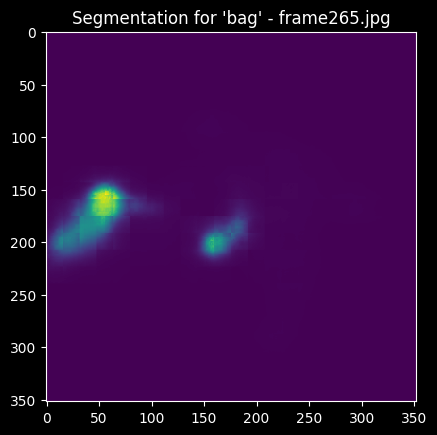

Unused or unrecognized kwargs: padding.


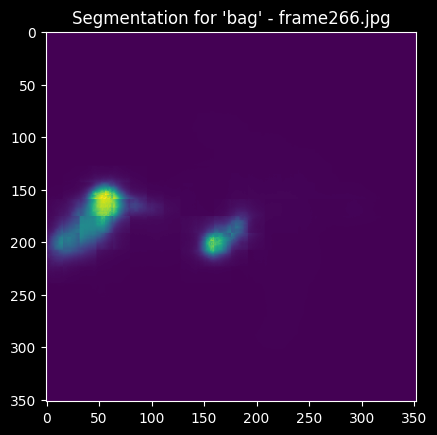

Unused or unrecognized kwargs: padding.


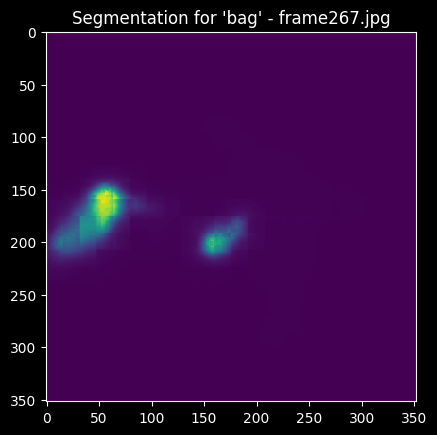

Unused or unrecognized kwargs: padding.


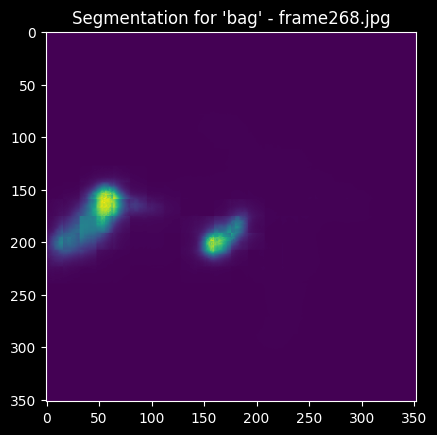

Unused or unrecognized kwargs: padding.


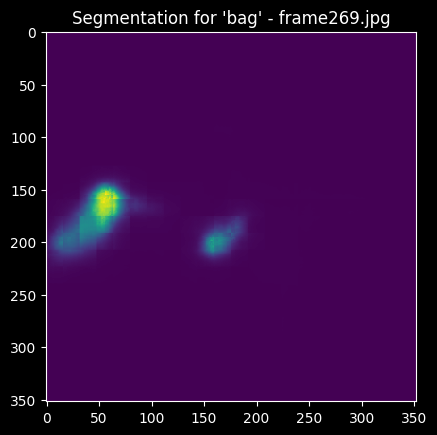

Unused or unrecognized kwargs: padding.


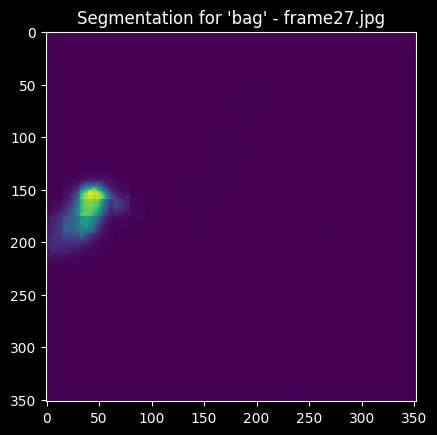

Unused or unrecognized kwargs: padding.


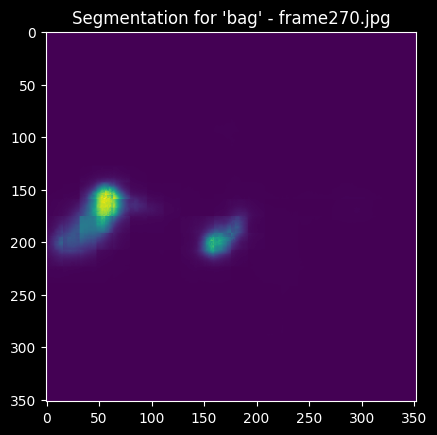

Unused or unrecognized kwargs: padding.


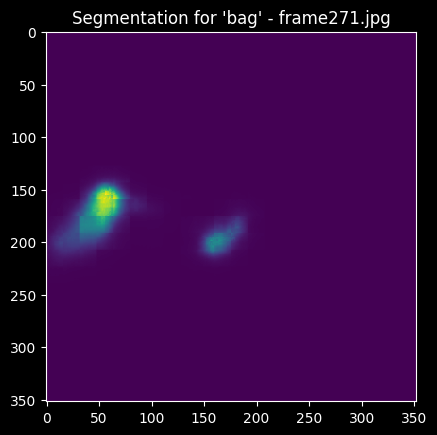

Unused or unrecognized kwargs: padding.


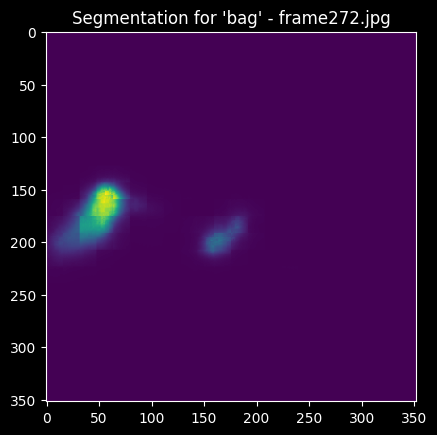

Unused or unrecognized kwargs: padding.


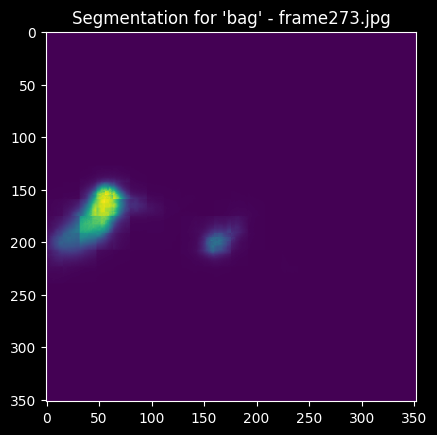

Unused or unrecognized kwargs: padding.


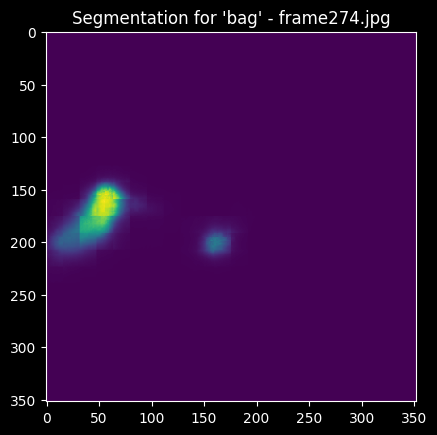

Unused or unrecognized kwargs: padding.


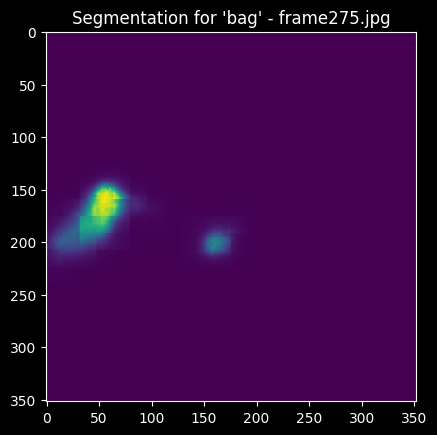

Unused or unrecognized kwargs: padding.


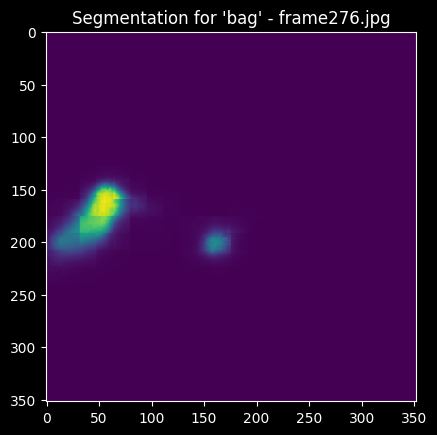

Unused or unrecognized kwargs: padding.


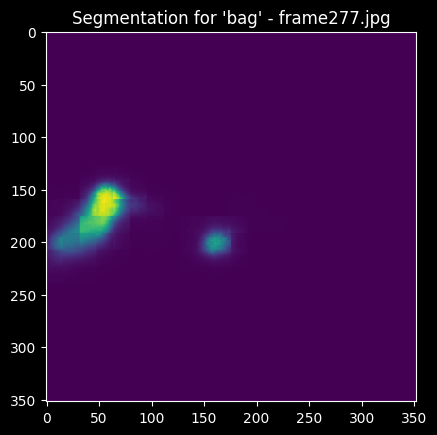

Unused or unrecognized kwargs: padding.


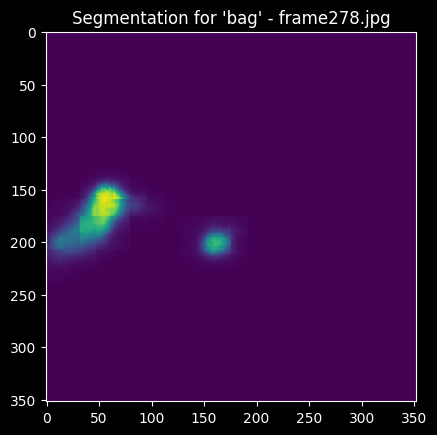

Unused or unrecognized kwargs: padding.


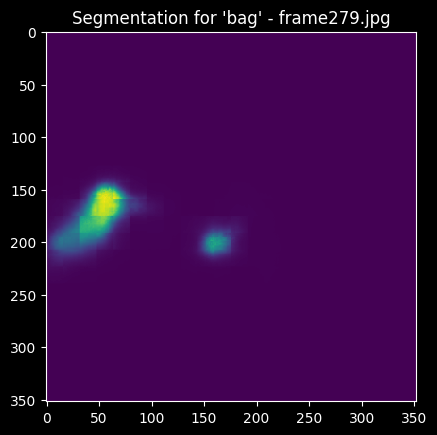

Unused or unrecognized kwargs: padding.


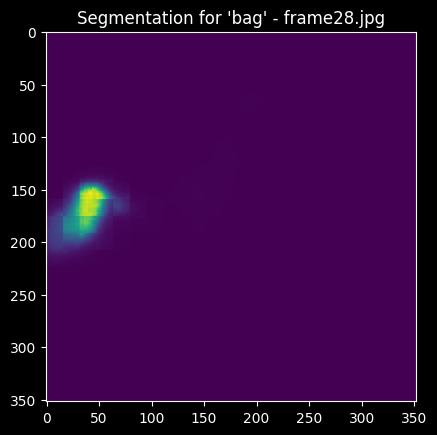

Unused or unrecognized kwargs: padding.


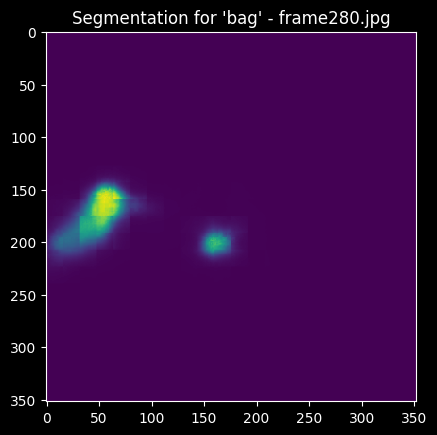

Unused or unrecognized kwargs: padding.


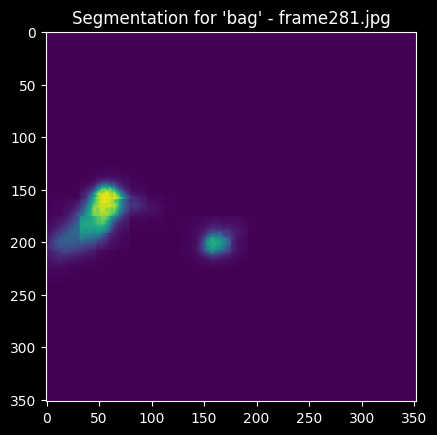

Unused or unrecognized kwargs: padding.


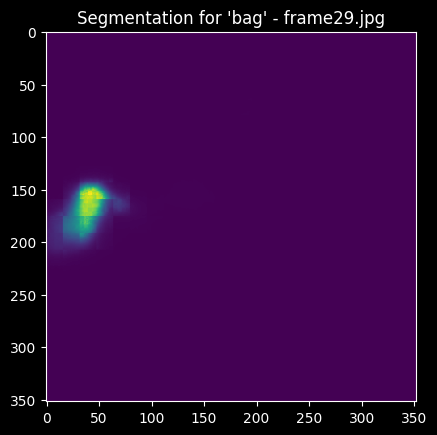

Unused or unrecognized kwargs: padding.


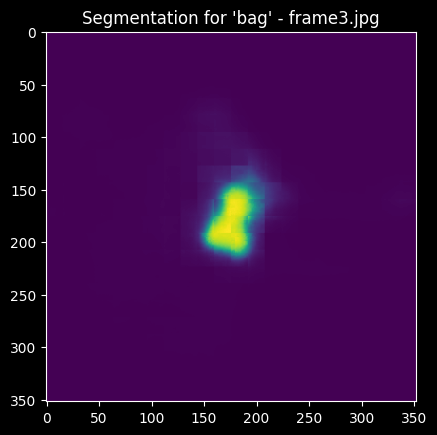

Unused or unrecognized kwargs: padding.


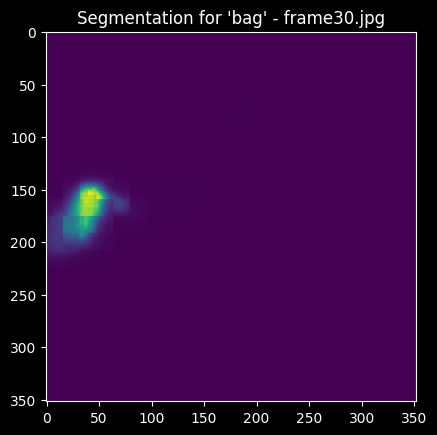

Unused or unrecognized kwargs: padding.


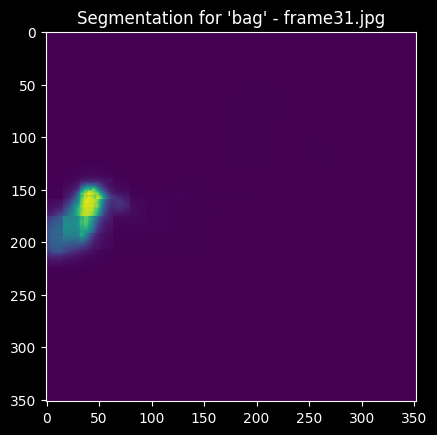

Unused or unrecognized kwargs: padding.


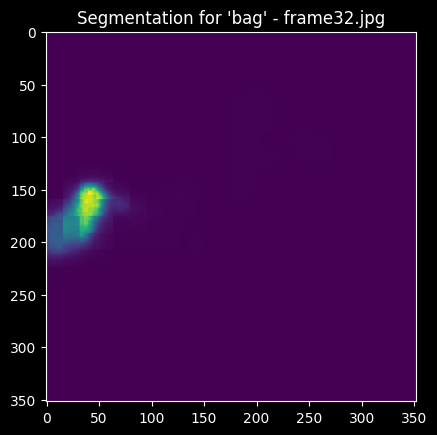

Unused or unrecognized kwargs: padding.


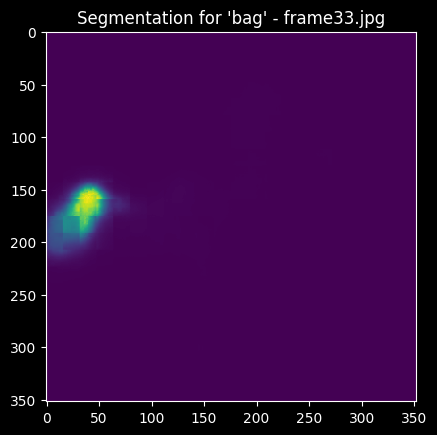

Unused or unrecognized kwargs: padding.


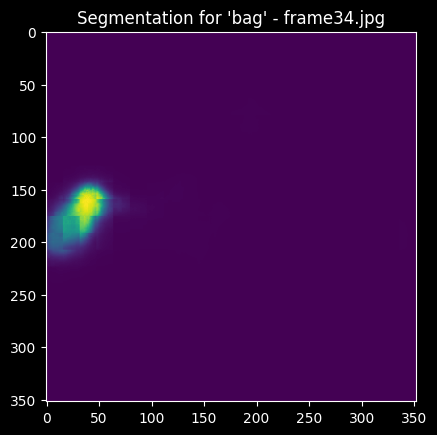

Unused or unrecognized kwargs: padding.


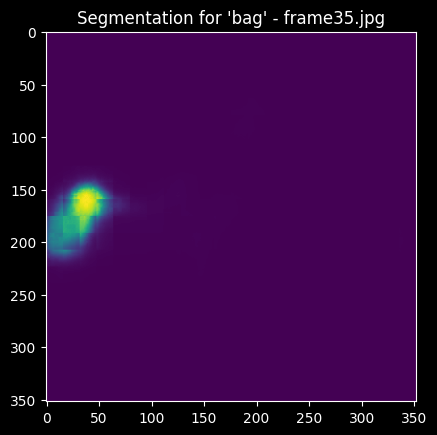

Unused or unrecognized kwargs: padding.


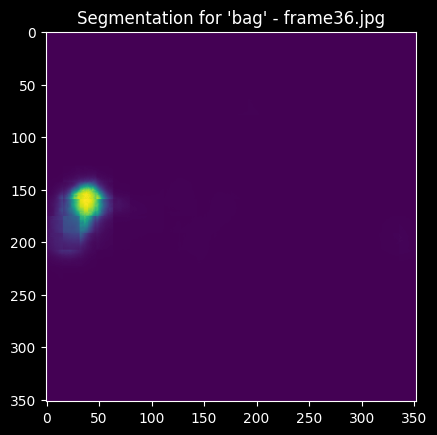

Unused or unrecognized kwargs: padding.


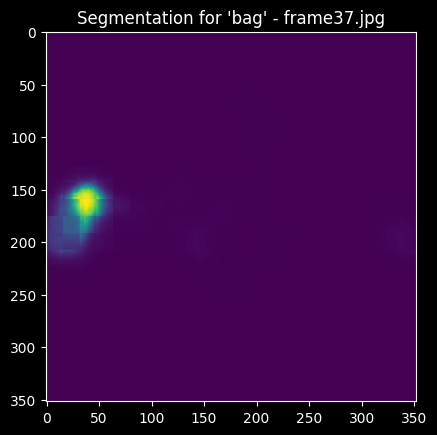

Unused or unrecognized kwargs: padding.


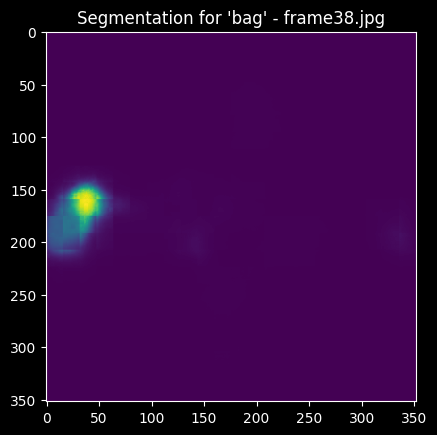

Unused or unrecognized kwargs: padding.


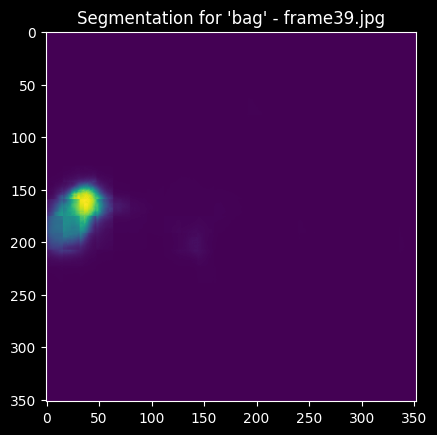

Unused or unrecognized kwargs: padding.


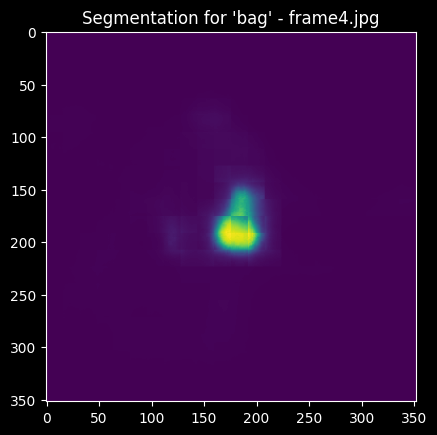

Unused or unrecognized kwargs: padding.


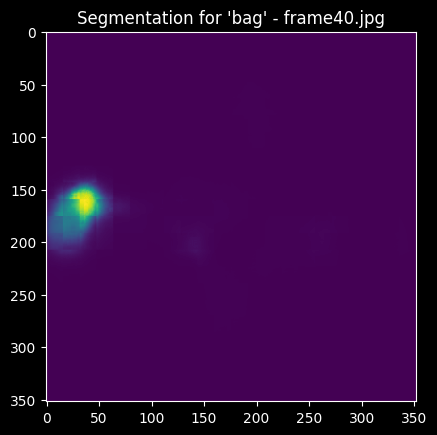

Unused or unrecognized kwargs: padding.


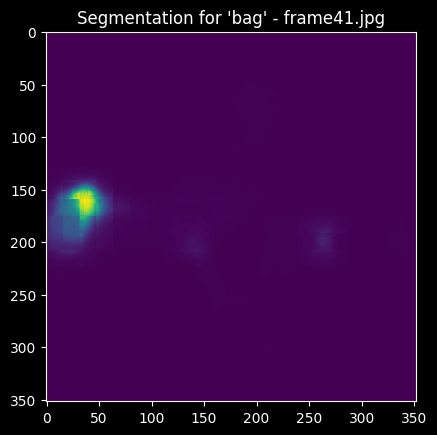

Unused or unrecognized kwargs: padding.


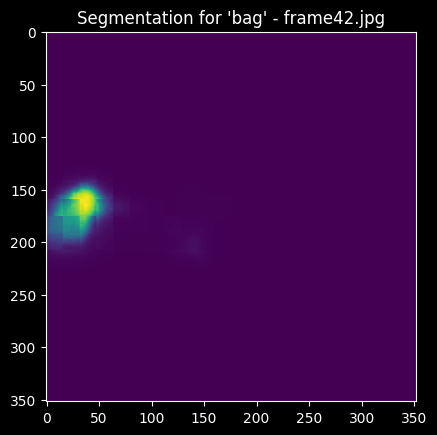

Unused or unrecognized kwargs: padding.


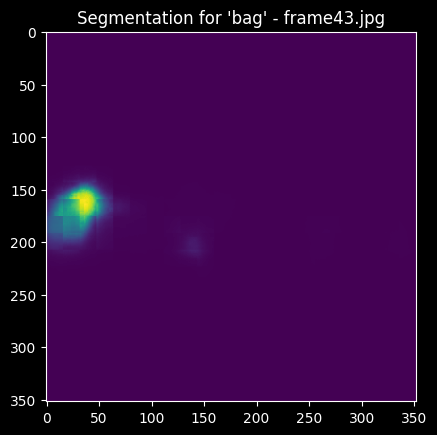

Unused or unrecognized kwargs: padding.


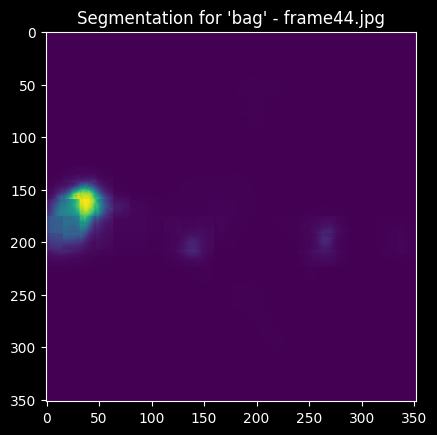

Unused or unrecognized kwargs: padding.


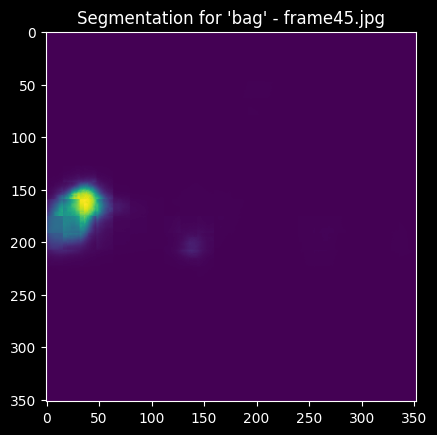

Unused or unrecognized kwargs: padding.


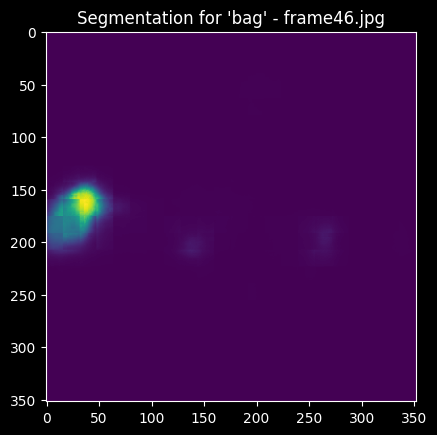

Unused or unrecognized kwargs: padding.


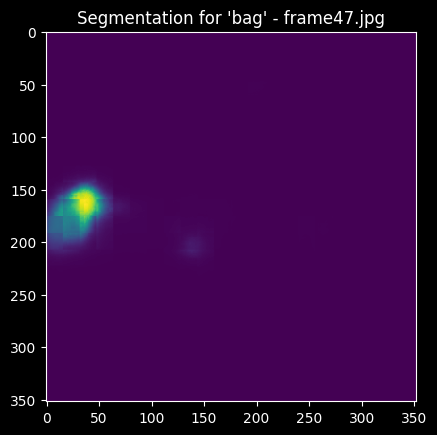

Unused or unrecognized kwargs: padding.


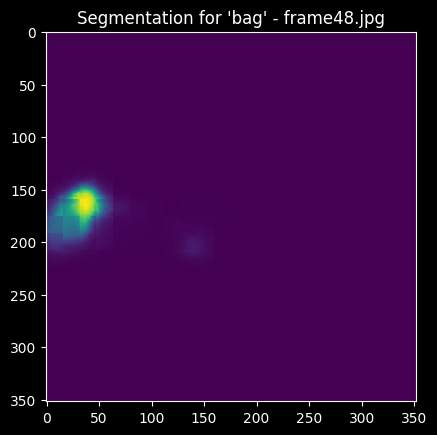

Unused or unrecognized kwargs: padding.


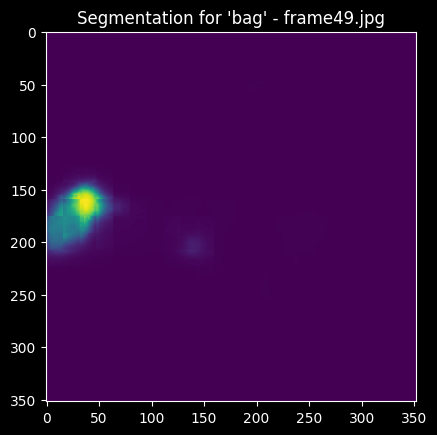

Unused or unrecognized kwargs: padding.


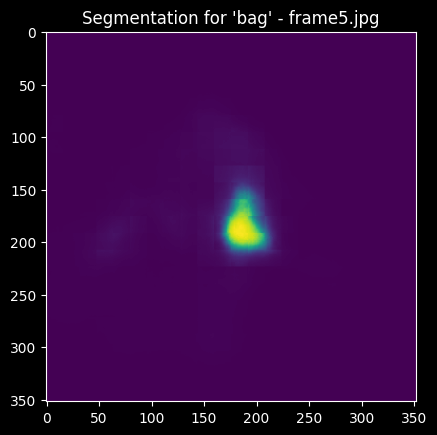

Unused or unrecognized kwargs: padding.


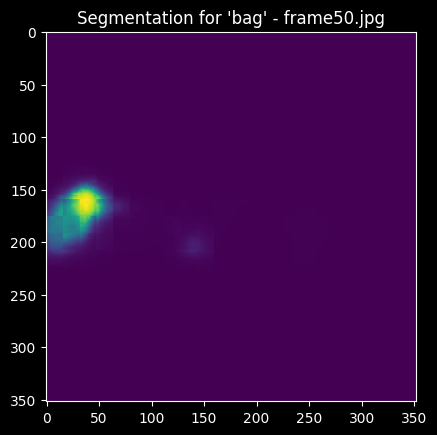

Unused or unrecognized kwargs: padding.


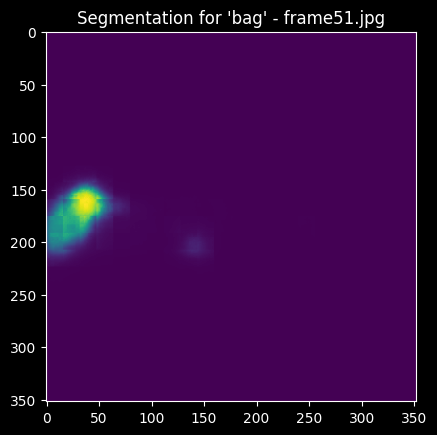

Unused or unrecognized kwargs: padding.


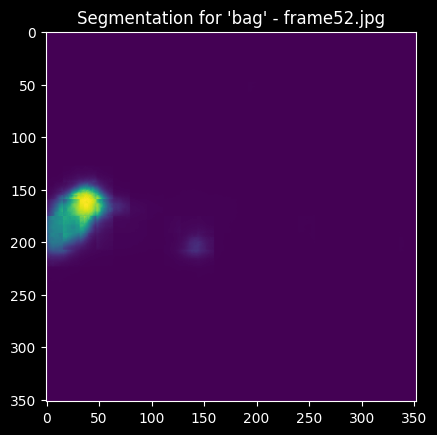

Unused or unrecognized kwargs: padding.


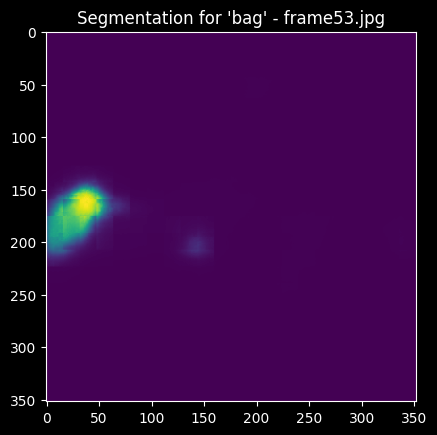

Unused or unrecognized kwargs: padding.


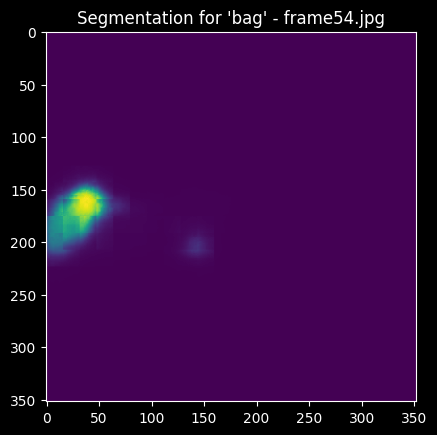

Unused or unrecognized kwargs: padding.


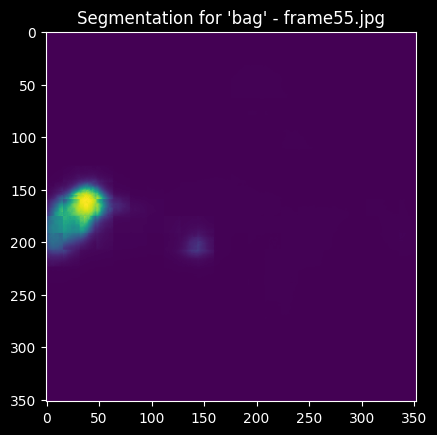

Unused or unrecognized kwargs: padding.


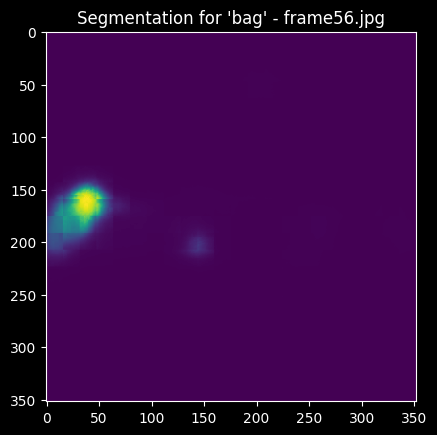

Unused or unrecognized kwargs: padding.


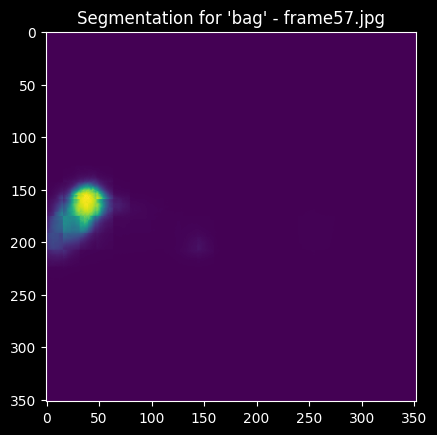

Unused or unrecognized kwargs: padding.


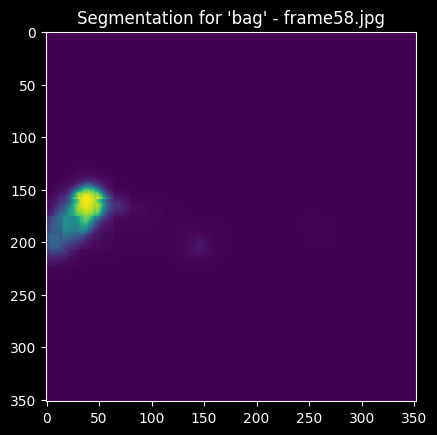

Unused or unrecognized kwargs: padding.


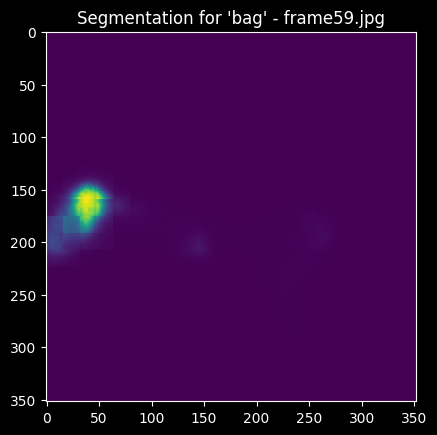

Unused or unrecognized kwargs: padding.


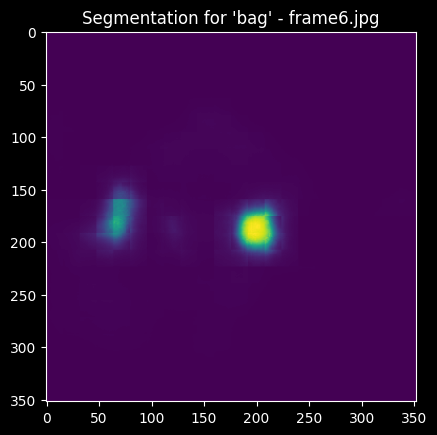

Unused or unrecognized kwargs: padding.


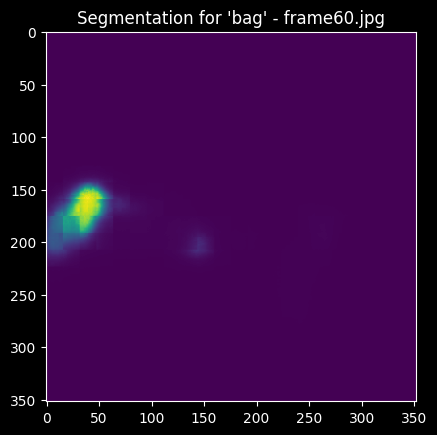

Unused or unrecognized kwargs: padding.


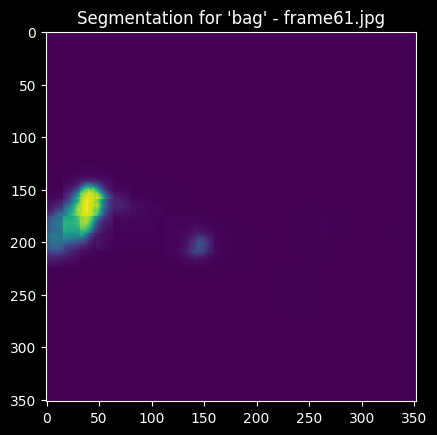

Unused or unrecognized kwargs: padding.


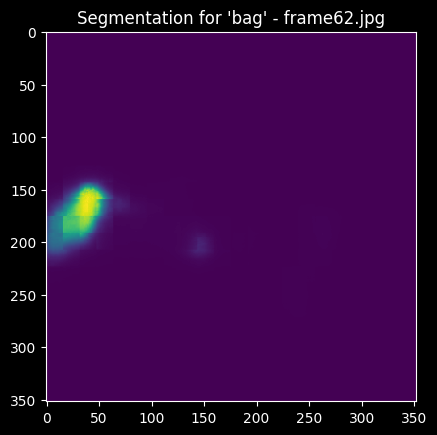

Unused or unrecognized kwargs: padding.


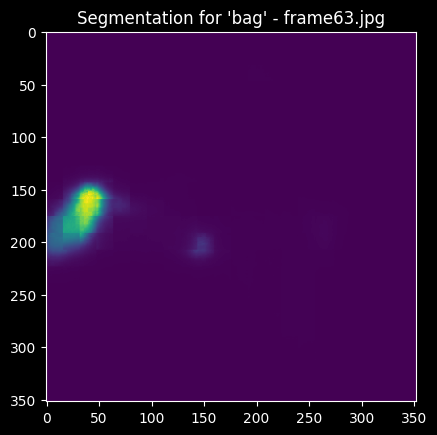

Unused or unrecognized kwargs: padding.


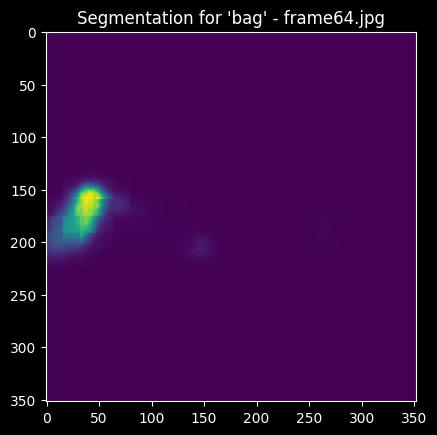

Unused or unrecognized kwargs: padding.


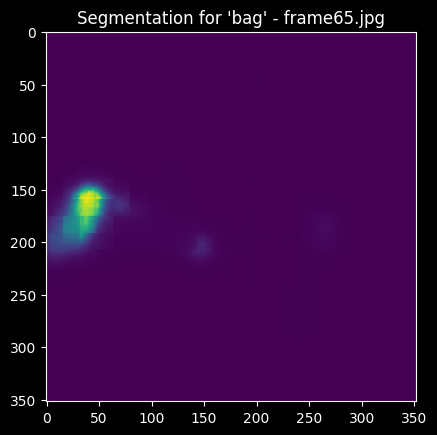

Unused or unrecognized kwargs: padding.


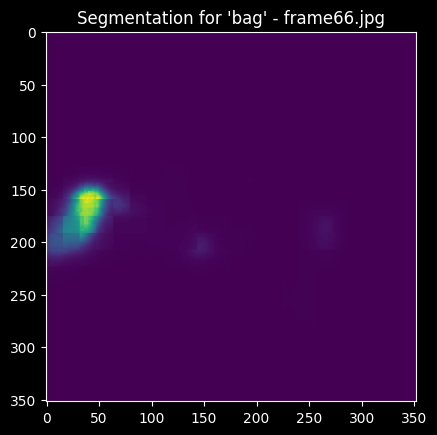

Unused or unrecognized kwargs: padding.


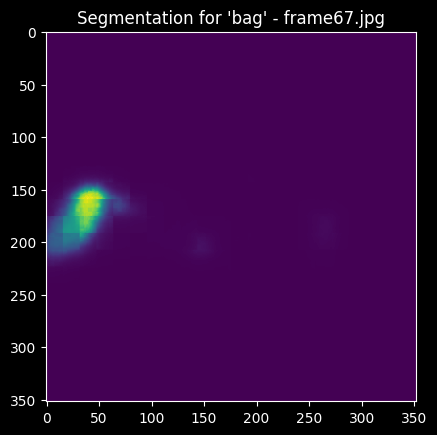

Unused or unrecognized kwargs: padding.


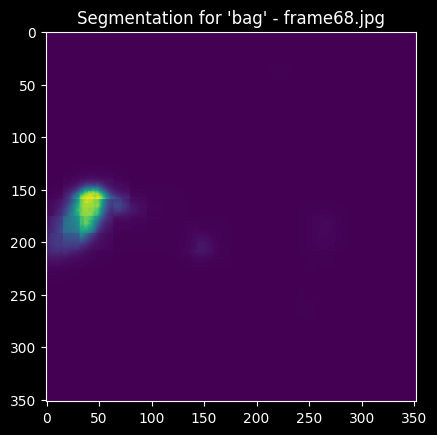

Unused or unrecognized kwargs: padding.


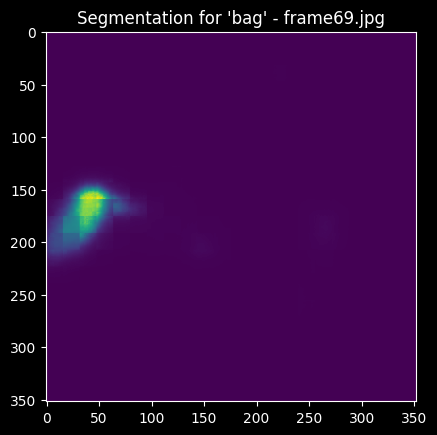

Unused or unrecognized kwargs: padding.


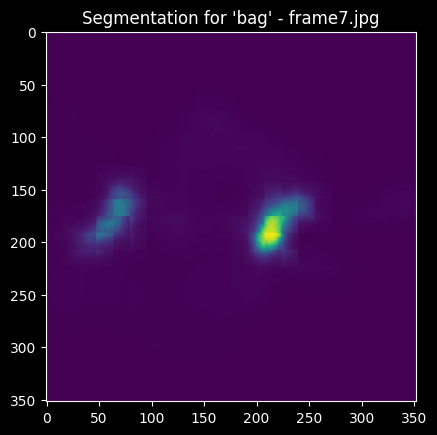

Unused or unrecognized kwargs: padding.


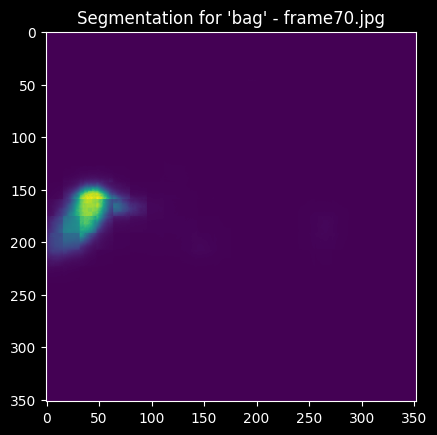

Unused or unrecognized kwargs: padding.


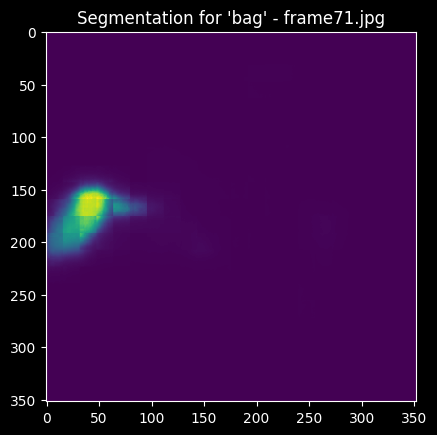

Unused or unrecognized kwargs: padding.


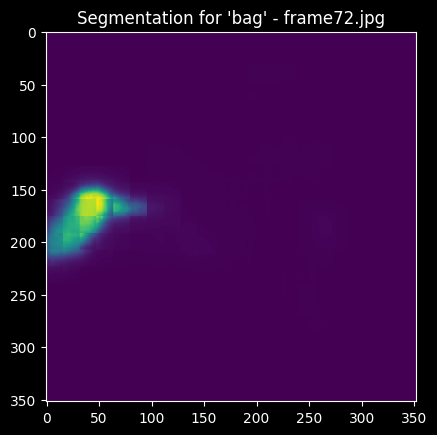

Unused or unrecognized kwargs: padding.


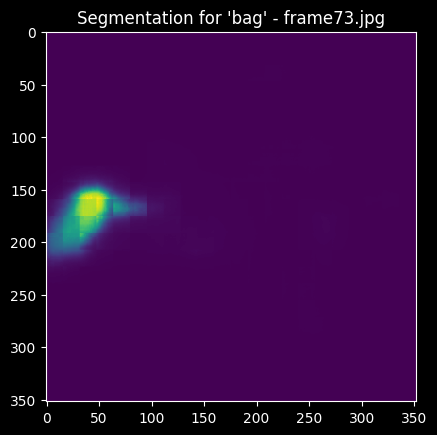

Unused or unrecognized kwargs: padding.


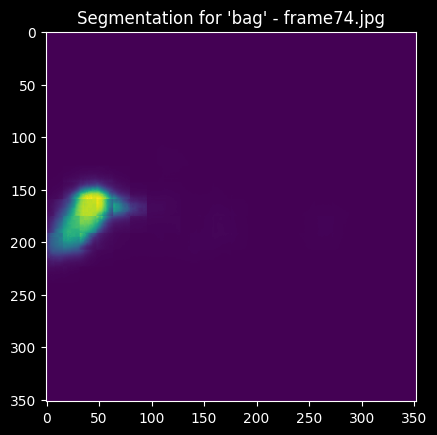

Unused or unrecognized kwargs: padding.


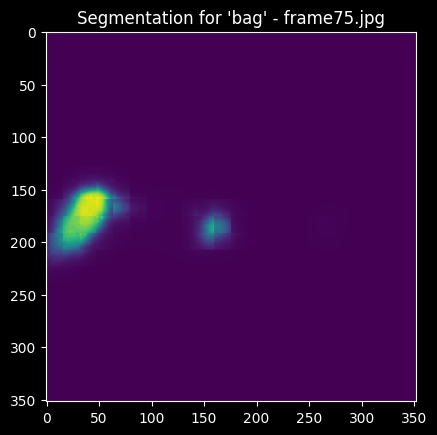

Unused or unrecognized kwargs: padding.


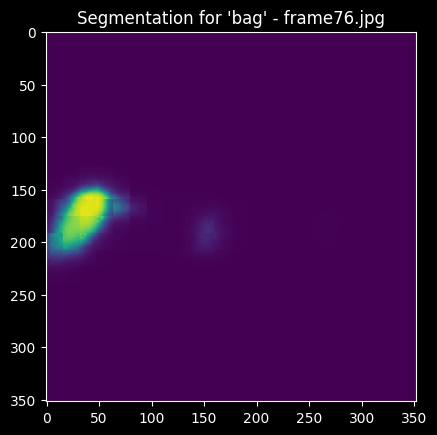

Unused or unrecognized kwargs: padding.


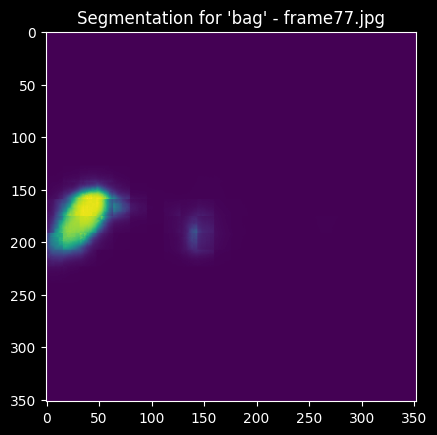

Unused or unrecognized kwargs: padding.


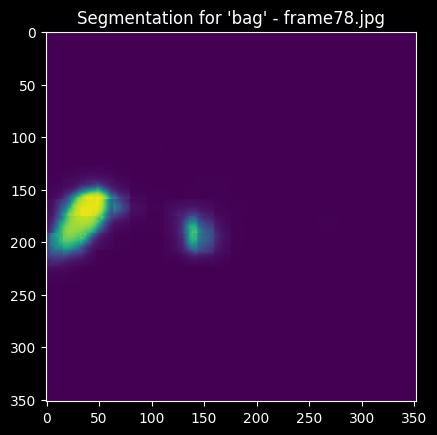

Unused or unrecognized kwargs: padding.


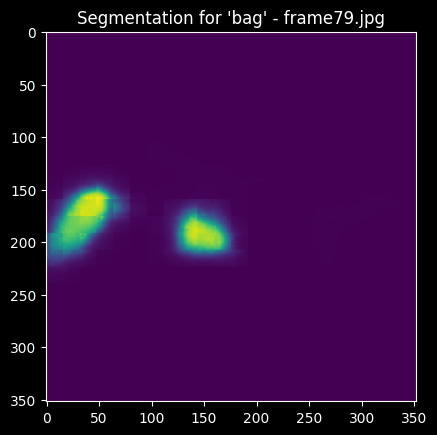

Unused or unrecognized kwargs: padding.


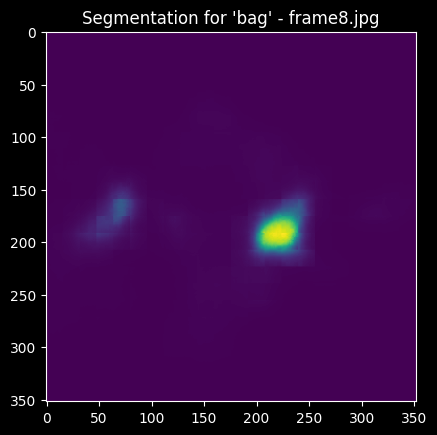

Unused or unrecognized kwargs: padding.


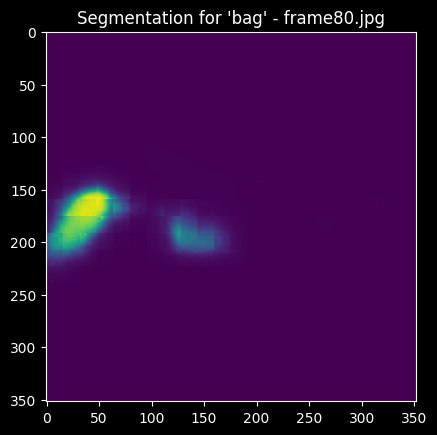

Unused or unrecognized kwargs: padding.


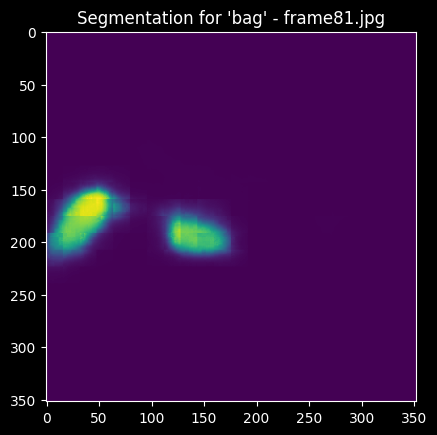

Unused or unrecognized kwargs: padding.


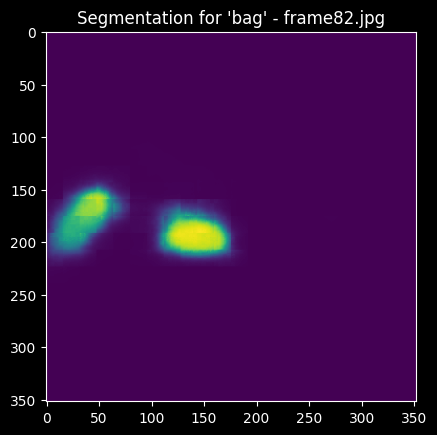

Unused or unrecognized kwargs: padding.


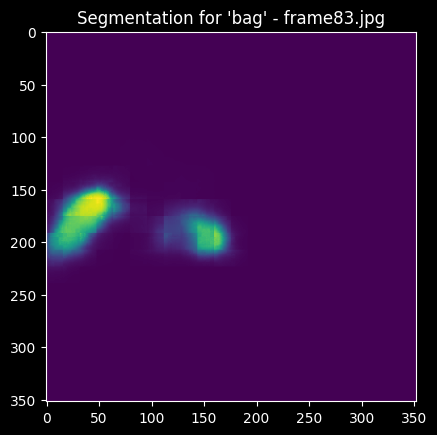

Unused or unrecognized kwargs: padding.


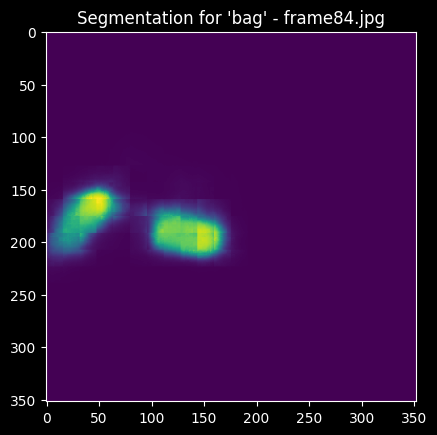

Unused or unrecognized kwargs: padding.


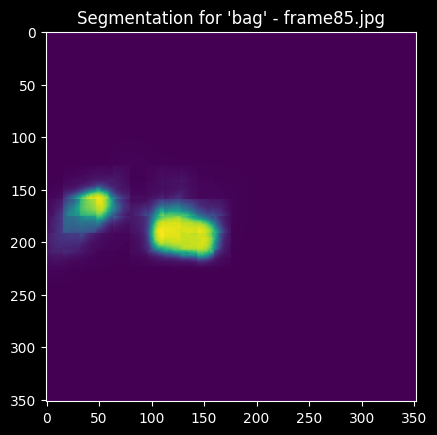

Unused or unrecognized kwargs: padding.


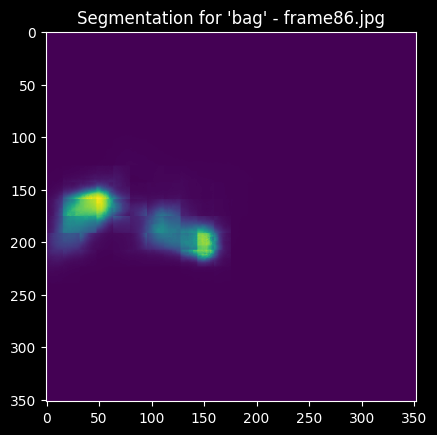

Unused or unrecognized kwargs: padding.


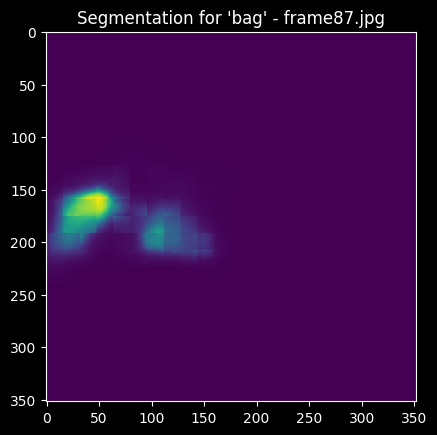

Unused or unrecognized kwargs: padding.


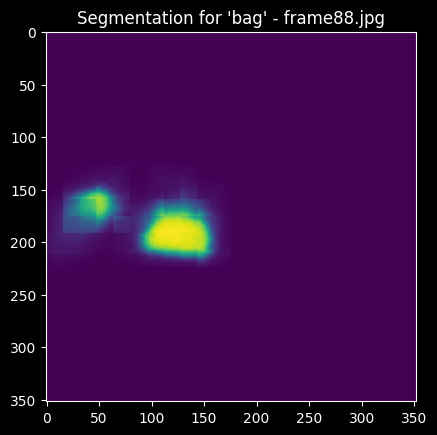

Unused or unrecognized kwargs: padding.


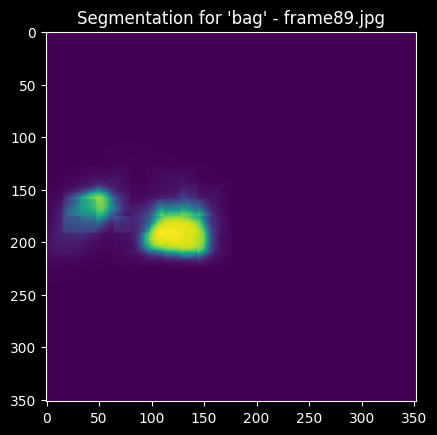

Unused or unrecognized kwargs: padding.


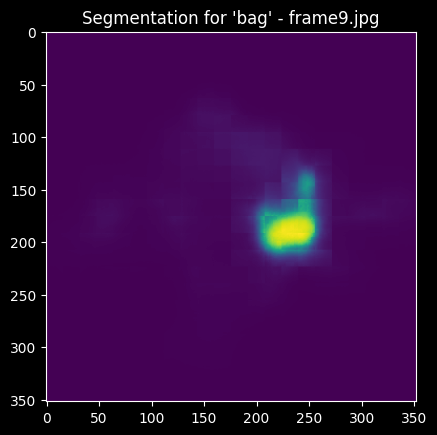

Unused or unrecognized kwargs: padding.


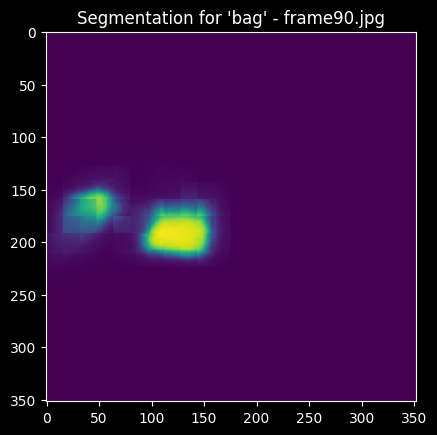

Unused or unrecognized kwargs: padding.


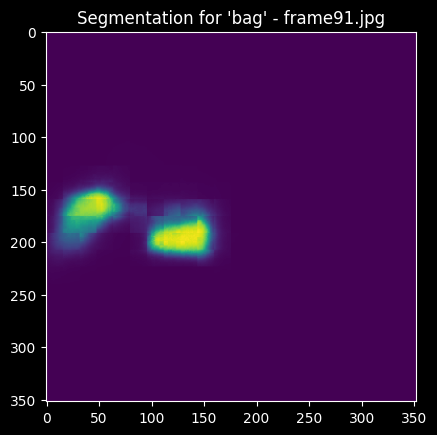

Unused or unrecognized kwargs: padding.


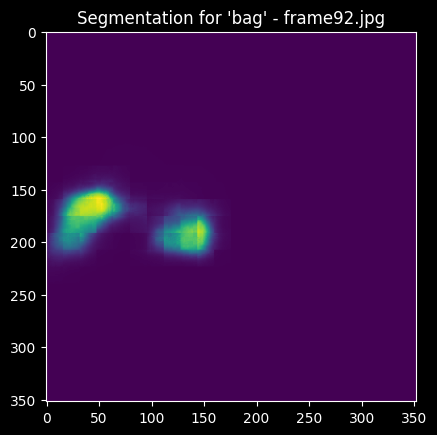

Unused or unrecognized kwargs: padding.


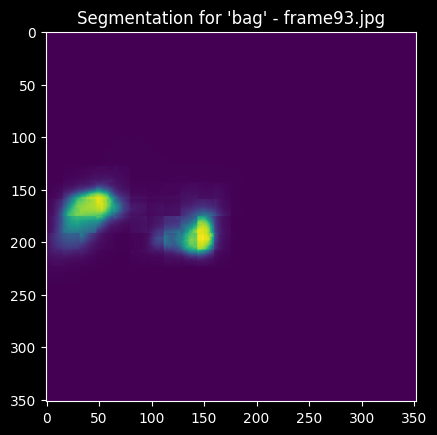

Unused or unrecognized kwargs: padding.


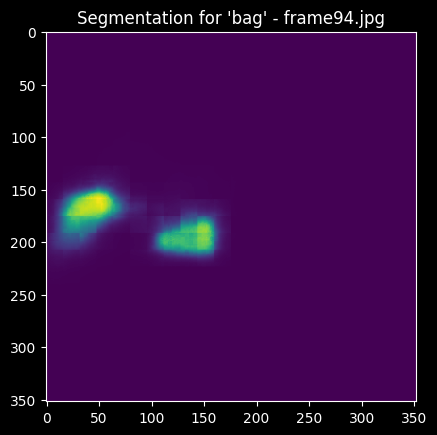

Unused or unrecognized kwargs: padding.


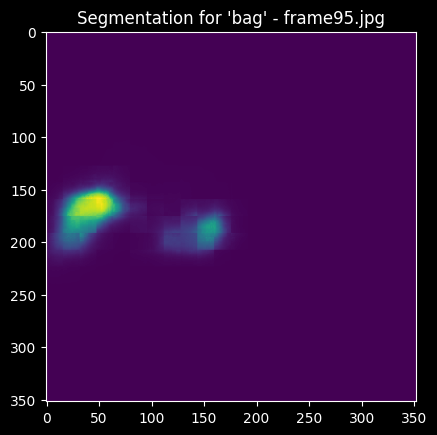

Unused or unrecognized kwargs: padding.


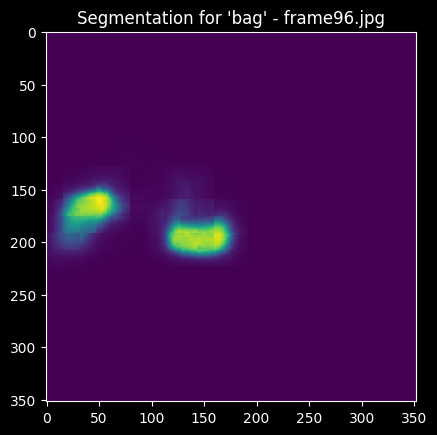

Unused or unrecognized kwargs: padding.


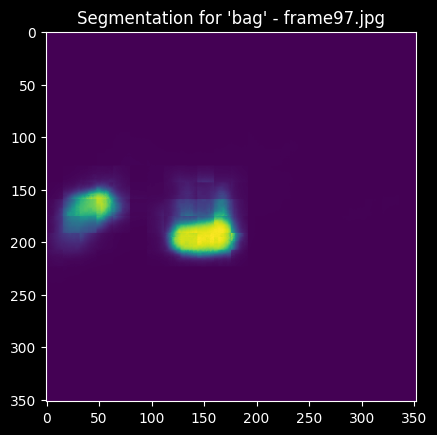

Unused or unrecognized kwargs: padding.


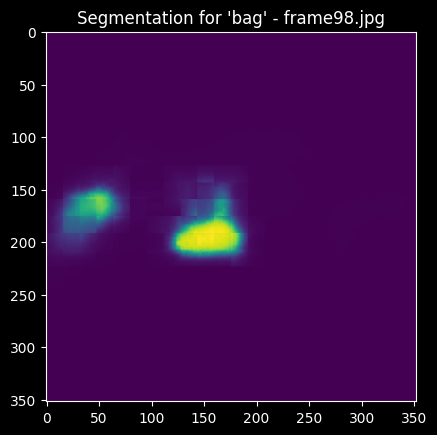

Unused or unrecognized kwargs: padding.


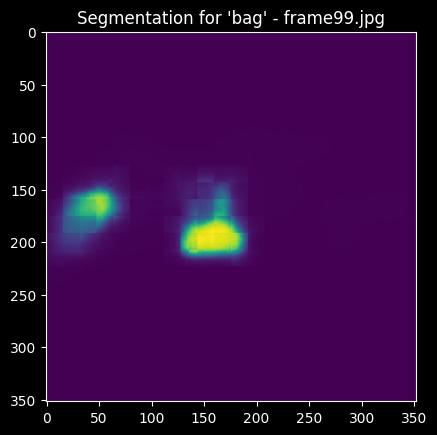

In [12]:
user_input = input("Input objects to segment (comma-separated): ")
prompts = user_input.split(', ')

def segment_images_in_folder(output_folder, prompts, output_segmented_folder):
    if not os.path.exists(output_segmented_folder):
        os.makedirs(output_segmented_folder)

    image_paths = [os.path.join(output_folder, file) for file in os.listdir(output_folder) if file.endswith(('.jpg', '.jpeg', '.png'))]
  
    for image_path in image_paths:
        image = Image.open(image_path)
        inputs = processor(text=prompts, images=[image] * len(prompts), padding="max_length", return_tensors="pt")
        with torch.no_grad():
            outputs = seg_model(**inputs)
        
        preds = outputs.logits.unsqueeze(1)
        for i, prompt in enumerate(prompts):
            pred = preds.squeeze(0)[i].unsqueeze(0)
            segmented_image = torch.sigmoid(pred.squeeze(0).squeeze(0)).cpu().numpy()
            plt.imshow(segmented_image)
            plt.title(f"Segmentation for '{prompt}' - {os.path.basename(image_path)}")
            plt.show()
            segmented_image_path = os.path.join(output_segmented_folder, f"{os.path.basename(image_path)}_{prompt}_segmented.jpg")
            plt.imsave(segmented_image_path, segmented_image, cmap='gray')

output_segmented_folder = 'E:/clipseg/segmented_img' 
segment_images_in_folder(output_folder, prompts, output_segmented_folder)

In [13]:
def merge_frames_to_video(input_folder, output_video_path, fps):
    image_paths = [os.path.join(input_folder, file) for file in os.listdir(input_folder) if file.endswith(('.jpg', '.jpeg', '.png'))]
    image_paths.sort()
    first_image = cv2.imread(image_paths[0])
    height, width, _ = first_image.shape
    fourcc = cv2.VideoWriter_fourcc(*'mp4v') 
    video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    for image_path in image_paths:
        image = cv2.imread(image_path)
        video_writer.write(image)

    video_writer.release()

input_folder = 'E:/clipseg/segmented_img' 
output_video_path = 'E:/clipseg/segmented_video.mp4' 
fps = 30 

merge_frames_to_video(input_folder, output_video_path, fps)

# Fine-tune text encoder with LoRa (PEFT)

In [2]:
from peft import LoraConfig, get_peft_model

c:\Users\flori\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
model_name = "openai/clip-vit-base-patch32" 
model = CLIPModel.from_pretrained(model_name)
processor = CLIPProcessor.from_pretrained(model_name)

In [6]:
text_encoder = model.text_model  # Extract the text encoder sub-model
config = LoraConfig(
    r=4,  
    lora_alpha=32, 
    target_modules=["q_proj", "v_proj"],  
    lora_dropout=0.0,  
    bias="none",  
)

lora_text_encoder = get_peft_model(text_encoder, config)

In [7]:
lora_text_encoder.save_pretrained('E:/clipseg/finetune')

In [8]:
clip_model = model 
clip_model.text_model = lora_text_encoder  # Replace text_model with LoRa model

In [16]:
text = "This is an example text."
inputs = processor(text, return_tensors="pt")  # Preprocess text

with torch.no_grad():
  text_features_1 = model.text_model(**inputs, output_hidden_states=True) 
  encoded_text = text_features_1["last_hidden_state"]  # Access encoded features
  print(encoded_text.shape)


torch.Size([1, 8, 512])


In [17]:
# Example usage for text encoding with the fine-tuned model
text = "This is an example text."
inputs = processor(text, return_tensors="pt")  # Preprocess text

with torch.no_grad():
  text_features_1 = clip_model.text_model(**inputs, output_hidden_states=True) 
  encoded_text = text_features_1["last_hidden_state"]  # Access encoded features
  print(encoded_text.shape)



torch.Size([1, 8, 512])


# Finetune inference

In [8]:
from PIL import Image
import torch
import matplotlib.pyplot as plt
import csv
import cv2
from cv2 import imshow
import os
import numpy as np
import pandas as pd
from scipy.io import loadmat
from pathlib import Path
from torchvision import transforms
# from mpl_toolkits.axisartist import ImageGrid

plt.style.use("dark_background")

In [5]:
from models.clipseg import CLIPDensePredT
model = CLIPDensePredT(version= 'ViT-B/16', reduce_dim=64)

model.load_state_dict(torch.load('E:\\clipseg\\weights\\rd64-uni.pth', map_location=torch.device('cpu')), strict = False)

model.eval()

CLIPDensePredT(
  (clip_model): CLIP(
    (visual): VisionTransformer(
      (conv1): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
      (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (transformer): Transformer(
        (resblocks): Sequential(
          (0): ResidualAttentionBlock(
            (attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
            )
            (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
            (mlp): Sequential(
              (c_fc): Linear(in_features=768, out_features=3072, bias=True)
              (gelu): QuickGELU()
              (c_proj): Linear(in_features=3072, out_features=768, bias=True)
            )
            (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          )
          (1): ResidualAttentionBlock(
            (attn): MultiheadAttention(
              (out_proj): NonDynamicallyQu

In [9]:
# load and normalize image
input_dir='E:\\clipseg\\datasets\\COCO-20i\\val2014\\COCO_val2014_000000229740.jpg'
input_image = Image.open(input_dir)


transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.Resize((352, 352)),
])
img = transform(input_image).unsqueeze(0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


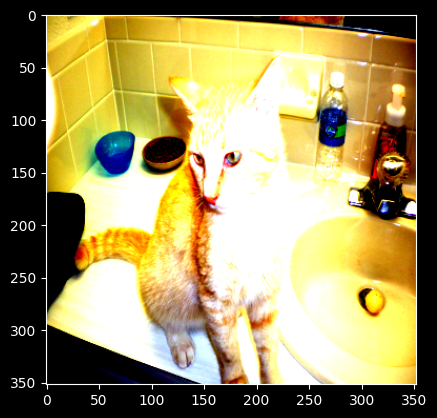

In [16]:
img_tmp = img.squeeze(0).numpy()

# Transpose the dimensions
img_tmp = img_tmp.transpose((1, 2, 0))

plt.imshow(img_tmp)
plt.show()

In [7]:
from models.clipseg import CLIPDensePredT
model_1 = CLIPDensePredT(version= 'ViT-B/16', reduce_dim=64)

model_1.load_state_dict(torch.load('E:/clipseg/weights_finetune/weights.pth', map_location=torch.device('cpu')), strict = False)

model_1.eval()

CLIPDensePredT(
  (clip_model): CLIP(
    (visual): VisionTransformer(
      (conv1): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
      (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (transformer): Transformer(
        (resblocks): Sequential(
          (0): ResidualAttentionBlock(
            (attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
            )
            (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
            (mlp): Sequential(
              (c_fc): Linear(in_features=768, out_features=3072, bias=True)
              (gelu): QuickGELU()
              (c_proj): Linear(in_features=3072, out_features=768, bias=True)
            )
            (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          )
          (1): ResidualAttentionBlock(
            (attn): MultiheadAttention(
              (out_proj): NonDynamicallyQu

torch.Size([4, 512])


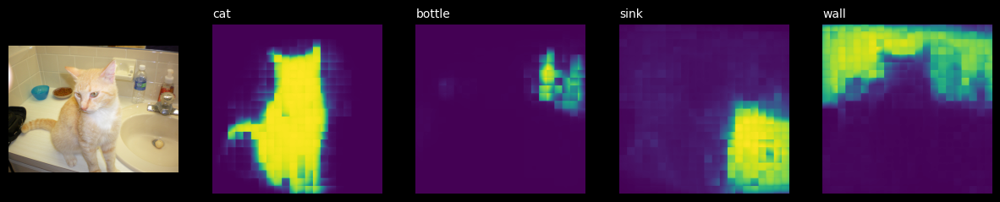

In [17]:
prompts = ['cat', 'bottle', 'sink', 'wall']

# predict
with torch.no_grad():
    preds = model(img.repeat(4,1,1,1), prompts)[0]
# visualize prediction
_, ax = plt.subplots(1, 5, figsize=(15, 4))
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(input_image)
[ax[i+1].imshow(torch.sigmoid(preds[i][0])) for i in range(4)]
[ax[i+1].text(0, -15, prompts[i]) for i in range(4)]

torch.Size([4, 512])


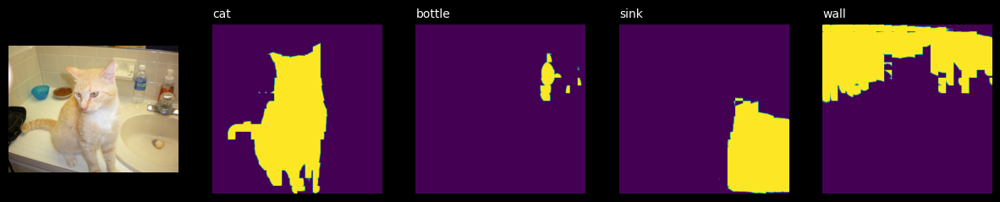

In [18]:
prompts = ['cat', 'bottle', 'sink', 'wall']

# predict
with torch.no_grad():
    preds = model_1(img.repeat(4,1,1,1), prompts)[0]
# visualize prediction
_, ax = plt.subplots(1, 5, figsize=(15, 4))
[a.axis('off') for a in ax.flatten()]
ax[0].imshow(input_image)
[ax[i+1].imshow(torch.sigmoid(preds[i][0])) for i in range(4)]
[ax[i+1].text(0, -15, prompts[i]) for i in range(4)]